# Основы глубинного обучения, майнор ИАД

## Домашнее задание 1. Введение в PyTorch. Полносвязные нейронные сети.

### Общая информация

Дата выдачи: 07.10.2023

Мягкий дедлайн: 23:59MSK 20.10.2023

Жесткий дедлайн: 23:59MSK 24.10.2023

### Оценивание и штрафы
Максимально допустимая оценка за работу — 10 баллов. За каждый день просрочки снимается 1 балл. Сдавать задание после жёсткого дедлайна сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.
Также оценка может быть снижена за плохо читаемый код и плохо оформленные графики. Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.

Итогова оценка считается как
$$
min(task_1, task_2)*0.6 + max(task_1, task_2)*0.2 + task_4*0.2
$$

где $task_1$, $task_2$ и $task_4$ - оценки за первое и второе заданиее соответсвенно.
Также, за домашнее задание выставляется 0, если не сделано нулевое или третье задание.
### О задании

В этом задании вам предстоит предсказывать год выпуска песни (**задача регрессии**) по некоторым звуковым признакам: [данные](https://archive.ics.uci.edu/ml/datasets/yearpredictionmsd). В ячейках ниже находится код для загрузки данных. Обратите внимание, что обучающая и тестовая выборки располагаются в одном файле, поэтому НЕ меняйте ячейку, в которой производится деление данных.

In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
import random
device = "cuda" if torch.cuda.is_available() else "cpu"
from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt

In [ ]:
!wget -O data.txt.zip https://archive.ics.uci.edu/ml/machine-learning-databases/00203/YearPredictionMSD.txt.zip

--2024-10-20 10:06:43--  https://archive.ics.uci.edu/ml/machine-learning-databases/00203/YearPredictionMSD.txt.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘data.txt.zip’

data.txt.zip            [            <=>     ] 201.24M  18.6MB/s    in 9.5s    

2024-10-20 10:06:53 (21.2 MB/s) - ‘data.txt.zip’ saved [211011981]



In [ ]:
df = pd.read_csv('data.txt.zip', header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903


Мы вывели кусок данных, чтобы понять, насколько они пригодны для работы без изменений. Здесь ясно, что сомнительно дальше с такими данными работать, потому что как минимум есть отрицательные значения, которые не отмасштабированы, кроме того еще сразу бросается в глаза совсем разная размерность, где-то видим реально большие числа, а где-то 0.075. Ясно, что будем скейлить.

In [ ]:
X = df.iloc[:, 1:].values
y = df.iloc[:, 0].values

train_size = 463715
X_train = X[:train_size, :]
y_train = y[:train_size]
X_test = X[train_size:, :]
y_test = y[train_size:]

## Задание 0. (0 баллов, но при невыполнении максимум за все задание &mdash; 0 баллов)

Мы будем использовать RMSE как метрику качества. Для самого первого бейзлайна обучите `Ridge` регрессию из `sklearn`. Кроме того, посчитайте качество при наилучшем константном прогнозе.

Для выполнения данного задания (и всех последующих) предобработайте данные.

1. Зафиксируйте random_seed везде где только возможно. Вам предоставлена функция для этого, однако вы можете дополнить ее своими дополнениями
2. Обучите StandertScaler и предобработайте ваши данные. В следующих заданиях можете использовать другой scaler или вообще отказаться от него


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
def set_random_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
    np.random.seed(seed)  # Numpy module.
    random.seed(seed)  # Python random module.
    torch.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.enabled = False

# у меня была не воспроизводимость кода во 2 задании, поэтому я изменила его по рекомендациям https://github.com/pytorch/pytorch/issues/7068

In [ ]:
set_random_seed(42)

In [ ]:
X = pd.DataFrame(X)
print(f'Пропущенные данные: {X.isna().values.any()}')

X_cat = (X.dtypes=='object').values
print(f'Категориальные переменные: {X_cat.any()}')

# проверяю на всякий случай, есть ли пропуски или категориальные данные

Пропущенные данные: False
Категориальные переменные: False


In [ ]:
scaler.fit(X_train)
X_norm_train = scaler.transform(X_train)
X_norm_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import Ridge

model = Ridge(random_state=42)
model.fit(X_norm_train, y_train)

Ridge(random_state=42)

In [ ]:
y_ridge_test = model.predict(X_norm_test)

In [ ]:
from sklearn.metrics import mean_squared_error
rmse_for_model = np.sqrt(mean_squared_error(y_test, y_ridge_test))
rmse_for_model

9.510160820470436

Лучшая константа для RMSE это среднее, посчитаем значение метрики при нем

In [ ]:
constant = np.mean(y)
y_pred_constant = np.full(y_test.shape, constant)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_constant))
print(f'RMSE(значение метрики): {rmse_best}')

# https://sky.pro/wiki/python/initsializatsiya-massiva-num-py-odinakovymi-znacheniyami/

RMSE(значение метрики): 10.8523584464736


## Задание 1. (максимум 10 баллов)

Закрепите свои знания о том, как pytorch работает с обратным распространением ошибки, проделав следующие шаги:

1. Создайте модель линейной регрессии, которая будет состоять только из одного Linear слоя.
2. Напишите цикл обучения вашей линейной регрессии. В нем реализуйте подсчет функции потерь, сделайте шаг градиентного спуска. Запрещено использовать готовые оптимизаторы и loss-функции из библиотеки pytorch. Для подсчета градиента воспользуйтесь методом backward.
3. Запустите обучение на 10 эпохах, после каждой проверяйте значение целевой метрики на тестовой выборке.
4. Выведите на экран графики метрики и значения функции потерь на тестовой и обучающей выборке.

В данном задании нет цели побить какой-то порог по метрике. Ваша задача - убедиться в том, что ваш рукописный цикл обучения работает. Для ускорения вычислений и обучения модели можете брать только срез данных, а не весь датасет.

In [ ]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
X_train_tensor = torch.from_numpy(X_norm_train[:100000]).float()
y_train_tensor = torch.from_numpy(y_train[:100000]).float()

X_test_tensor = torch.from_numpy(X_norm_test[:25000]).float()
y_test_tensor = torch.from_numpy(y_test[:25000]).float()

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32)

test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_dataloader = DataLoader(test_dataset, batch_size=32)

# https://stackoverflow.com/questions/67620076/create-dataset-out-of-x-train-and-y-train

In [ ]:
class LinearRegressionModel(nn.Module):
    def __init__(self):
      super(LinearRegressionModel, self).__init__()
      self.linear1 = nn.Linear(90, 40)
      self.relu = nn.ReLU()
      self.linear2 = nn.Linear(40,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      return self.linear2(pred2)

 # к сожалению, мне пришлось добавить еще слоев просто потому что ошибка убывала линейно, и ничего не помогало
# я обратилась к семинаристу, и он подсказал такой выход. не обижайтесь на меня!!

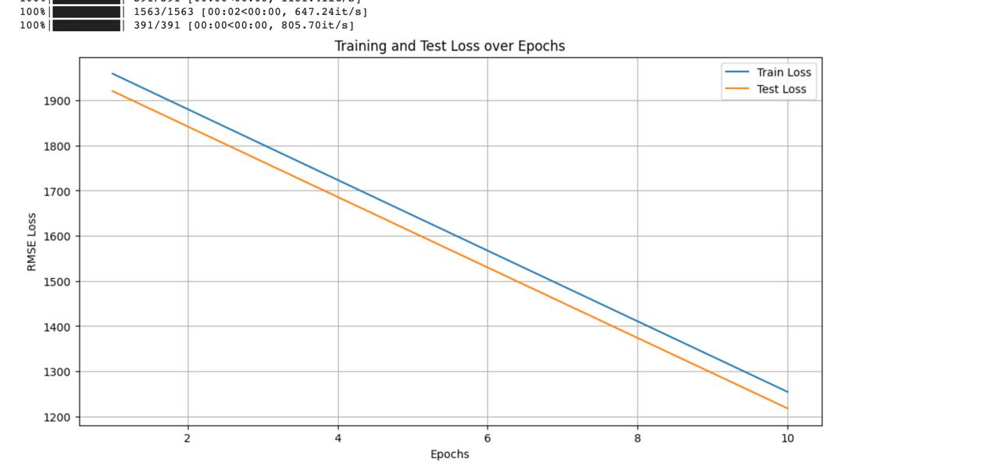

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
def train(model, dataloader_train, dataloader_test, n_epochs=10, learning_rate=0.001):

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)

    all_train = []
    all_test = []

    for epoch in range(n_epochs):
        model.train()
        epoch_train = []

        for x_train, y_train in tqdm(dataloader_train):
            x_train, y_train = x_train.to(device), y_train.to(device)

            y_pred = model(x_train)
            train_loss = torch.sqrt(torch.mean((y_pred - y_train) ** 2))

            train_loss.backward() #  Модель вычисляет градиенты потерь по отношению к весам -> насколько изменение веса влияет на ошибку?

            with torch.no_grad():
                for param in model.parameters():
                    if param.grad is not None:
                      param -= learning_rate * param.grad

            model.zero_grad() # зануляем градиенты, чтобы их не аккумулировать

            epoch_train.append(train_loss.cpu().detach().numpy())

        all_train.append(np.mean(epoch_train)) #Returns the value of this tensor as a standard Python number.
        # https://pytorch.org/docs/stable/generated/torch.Tensor.item.html

        model.eval()
        epoch_test = []
        with torch.no_grad():
            for x_test, y_test in tqdm(dataloader_test):
                x_test, y_test = x_test.to(device), y_test.to(device)
                y_pred_test = model(x_test)
                test_loss = torch.sqrt(torch.mean((y_pred_test - y_test) ** 2))
                epoch_test.append(test_loss.cpu().detach().numpy())

        all_test.append(np.mean(epoch_test))

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, n_epochs + 1), all_train, label='Train Loss')
    plt.plot(range(1, n_epochs + 1), all_test, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Training and Test Loss over Epochs')
    plt.legend()
    plt.grid()
    plt.show()

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/3125 [00:00<?, ?it/s]

  0%|          | 0/782 [00:00<?, ?it/s]

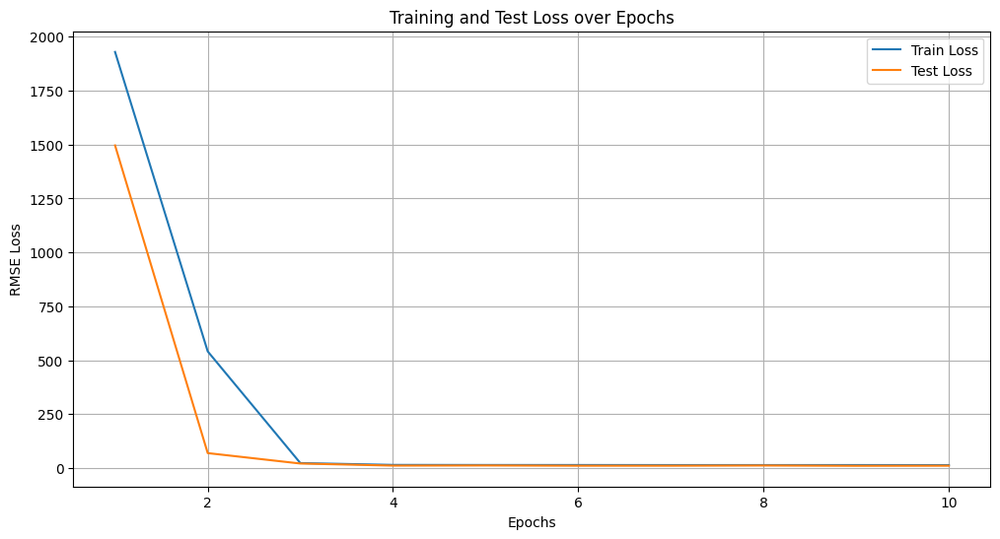

In [ ]:
set_random_seed(42)
model = LinearRegressionModel()
model.to(device)
train(model, train_dataloader, test_dataloader)

## Задание 2. (максимум 10 баллов)

Реализуйте обучение и тестирование нейронной сети для предоставленного вам набора данных. Соотношение между полученным значением метрики на тестовой выборке и баллами за задание следующее:

- $\text{RMSE} \le 9.00 $ &mdash; 4 балла
- $\text{RMSE} \le 8.90 $ &mdash; 6 баллов
- $\text{RMSE} \le 8.80 $ &mdash; 8 баллов
- $\text{RMSE} \le 8.75 $ &mdash; 10 баллов

Есть несколько правил, которых вам нужно придерживаться:

- Весь пайплайн обучения должен быть написан на PyTorch. При этом вы можете пользоваться другими библиотеками (`numpy`, `sklearn` и пр.), но только для обработки данных. То есть как угодно трансформировать данные и считать метрики с помощью этих библиотек можно, а импортировать модели из `sklearn` и выбивать с их помощью требуемое качество &mdash; нельзя. Также нельзя пользоваться библиотеками, для которых сам PyTorch является зависимостью.

- Мы никак не ограничиваем ваш выбор архитектуры модели, но скорее всего вам будет достаточно полносвязной нейронной сети.

- Для обучения запрещается использовать какие-либо иные данные, кроме обучающей выборки.

- Ансамблирование моделей запрещено.

### Полезные советы:

- Очень вряд ли, что у вас с первого раза получится выбить качество на 10 баллов, поэтому пробуйте разные архитектуры, оптимизаторы и значения гиперпараметров. В идеале при запуске каждого нового эксперимента вы должны менять что-то одно, чтобы точно знать, как этот фактор влияет на качество.

- Не забудьте, что для улучшения качества модели вам поможет **нормировка таргета**.

- Тот факт, что мы занимаемся глубинным обучением, не означает, что стоит забывать про приемы, использующиеся в классическом машинном обучении. Так что обязательно проводите исследовательский анализ данных, отрисовывайте нужные графики и не забывайте про масштабирование и подбор гиперпараметров.

- Вы наверняка столкнетесь с тем, что ваша нейронная сеть будет сильно переобучаться. Для нейросетей существуют специальные методы регуляризации, например, dropout ([статья](https://jmlr.org/papers/volume15/srivastava14a/srivastava14a.pdf)) и weight decay ([блогпост](https://towardsdatascience.com/weight-decay-l2-regularization-90a9e17713cd)). Они, разумеется, реализованы в PyTorch. Попробуйте поэкспериментировать с ними.

- Если вы чего-то не знаете, не гнушайтесь гуглить. В интернете очень много полезной информации, туториалов и советов по глубинному обучению в целом и по PyTorch в частности. Но не забывайте, что за скатанный код без ссылки на источник придется ответить по всей строгости!

- Если вы сразу реализуете обучение на GPU, то у вас будет больше времени на эксперименты, так как любые вычисления будут работать быстрее. Google Colab предоставляет несколько GPU-часов (обычно около 8-10) в сутки бесплатно.

- Чтобы отладить код, можете обучаться на небольшой части данных или даже на одном батче. Если лосс на обучающей выборке не падает, то что-то точно идет не так!

- Пользуйтесь утилитами, которые вам предоставляет PyTorch (например, Dataset и Dataloader). Их специально разработали для упрощения разработки пайплайна обучения.

- Скорее всего вы захотите отслеживать прогресс обучения. Для создания прогресс-баров есть удобная библиотека `tqdm`.

- Быть может, вы захотите, чтобы графики рисовались прямо во время обучения. Можете воспользоваться функцией [clear_output](http://ipython.org/ipython-doc/dev/api/generated/IPython.display.html#IPython.display.clear_output), чтобы удалять старый график и рисовать новый на его месте.

**ОБЯЗАТЕЛЬНО** рисуйте графики зависимости лосса/метрики на обучающей и тестовой выборках в зависимости от времени обучения. Если обучение занимает относительно небольшое число эпох, то лучше рисовать зависимость от номера шага обучения, если же эпох больше, то рисуйте зависимость по эпохам. Если проверяющий не увидит такого графика для вашей лучшей модели, то он в праве снизить баллы за задание.

**ВАЖНО!** Ваше решение должно быть воспроизводимым. Если это не так, то проверяющий имеет право снизить баллы за задание. Чтобы зафиксировать random seed, воспользуйтесь функцией из предыдущего задания.



Вы можете придерживаться любой адекватной струкуры кода, но мы советуем воспользоваться сигнатурами функций, которые приведены ниже. Лучше всего, если вы проверите ваши предсказания ассертом: так вы убережете себя от разных косяков, например, что вектор предсказаний состоит из всего одного числа. В любом случае, внимательно следите за тем, для каких тензоров вы считаете метрику RMSE. При случайном или намеренном введении в заблуждение проверяющие очень сильно разозлятся.

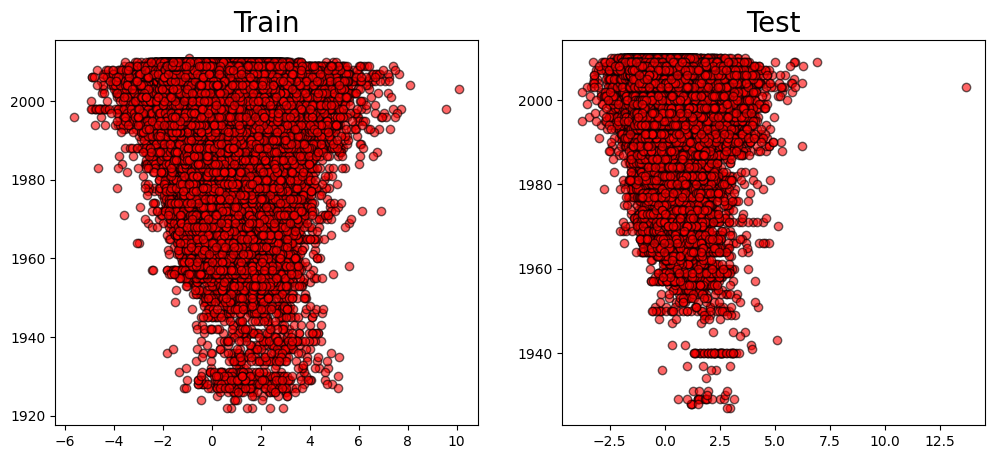

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

ax1.scatter(X_norm_train[:,5], y_train, c='red', marker='o', edgecolors = 'black', alpha = 0.6)
ax1.set_title('Train', fontsize=20)

ax2.scatter(X_norm_test[:,5], y_test, c='red', marker='o', edgecolors = 'black', alpha = 0.6)
ax2.set_title('Test', fontsize=20);

# https://habr.com/ru/articles/553716/
# да уж, уловить связь сложно, видно только что аутлайеры по разным признакам чаще относятся к 2000+ (тем не менее, это ни о чем не говорит, объектов с таг=ргетом 2000 в целом больше)

In [ ]:
X.corr()

# сильная корреляция встречается довольно редко. между 0 и 1 довольно неплохая корреляция
# нам это ничего не дает, но для EDA сделать надо..
# в целом мы глянули все возможное (даже аутлаеры и missing values), но нам это не помогло, потому что признаки абсолютно не интуитивные

,0,1,2,3,4,5,6,7,8,9,...,80,81,82,83,84,85,86,87,88,89
0,1.000000,0.561747,0.245415,0.022270,-0.283635,-0.267820,0.170659,-0.057822,0.218736,0.103704,...,-0.359808,0.190359,-0.137876,0.030790,0.130742,-0.025499,0.048367,-0.145238,-0.105449,-0.183504
1,0.561747,1.000000,0.018479,0.126845,-0.184864,-0.112388,0.115468,0.108088,0.126086,0.371357,...,-0.289733,0.053480,-0.151313,0.022337,0.150309,0.048165,-0.004499,-0.015567,-0.121116,-0.159893
2,0.245415,0.018479,1.000000,0.152488,-0.131741,0.040808,-0.057642,0.080881,0.043885,-0.089869,...,0.070644,0.172473,0.109202,-0.007989,-0.033774,-0.093817,0.078392,-0.060559,-0.099712,0.094694
3,0.022270,0.126845,0.152488,1.000000,0.034988,0.321159,0.282162,0.031649,-0.037905,0.165343,...,-0.018894,-0.090732,0.043403,0.058974,-0.067529,0.041973,0.031072,0.248128,0.034055,0.011724
4,-0.283635,-0.184864,-0.131741,0.034988,1.000000,0.015561,-0.103110,-0.013265,-0.217551,-0.104766,...,0.038511,-0.088296,0.034104,-0.010014,0.007378,0.004524,-0.006359,-0.016779,0.006124,0.031739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,-0.025499,0.048165,-0.093817,0.041973,0.004524,0.211509,-0.017750,-0.028124,0.012582,0.033973,...,-0.023269,-0.139944,0.081741,0.088437,0.055266,1.000000,0.009603,0.152288,0.152311,-0.010400
86,0.048367,-0.004499,0.078392,0.031072,-0.006359,-0.038859,0.016209,0.013734,0.060279,0.021224,...,0.048025,-0.014376,0.145660,0.329289,0.005876,0.009603,1.000000,0.012255,0.108086,0.249920
87,-0.145238,-0.015567,-0.060559,0.248128,-0.016779,0.146493,0.068457,0.047882,-0.010335,0.040876,...,0.078496,0.027713,0.273890,0.005454,-0.215873,0.152288,0.012255,1.000000,0.065642,0.224785
88,-0.105449,-0.121116,-0.099712,0.034055,0.006124,-0.018272,0.079342,0.000330,-0.007362,-0.031074,...,0.101536,-0.055384,0.046201,0.061739,-0.035505,0.152311,0.108086,0.065642,1.000000,0.199018


In [ ]:
from torch.utils.data import Dataset, DataLoader

# из-за того, что наша дата не в виде тензоров (нестандартный формат для пай торча), нам надо "обернуть" их
class MyDataset(Dataset):

    def __init__(self, X, y):
        self.X = torch.Tensor(X)
        self.y = torch.Tensor(y).float() # с учетом стандартизации здесь поменяла на тензор, а то была ошибка из-за несоответствия типов данных

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):  # по номеру сам объект берем
        return {
            # sample - признаки
            "sample": self.X[idx], # немного подредактировала код с  torch.tensor(self.X[idx, :], dtype=torch.float), потоум что были ошибки
            "target":  self.y[idx],
        }

# https://habr.com/ru/articles/553716/ +  код с 1 сема

In [ ]:
pip install --upgrade torch torchvision torchaudio # уже во время выполнения 4 задания появилась ошибка - RuntimeError: CUDA error: device-side assert triggered.

!!!! ПРОЧИТАЙТЕ ДИСКЛЕЙМЕР !!!!

когда делала это задание, я считала сумму рмсе, но за день до ддл прочитала в беседе, что кто-то  предположил, что надо было считать сумму мсе, а потом из этого уже получать рмсе.

я не поняла, какой способ правильный, поэтому оставила оба варианта решения.

1) сумма рмсе - я смогла выбить 8.75

2) рмсе сумм - выбила только 8.89 (делала это 8 часов подряд..)

в общем, ставьте такую оценку, которую считаете нужной, но объясните, почему так! буду очень благодарна. и в следующий раз уточняйте, что вам нужно. нам, гуманитариям, правда сложно понять разницу между суммой рмсе и рмсе сумм.. i've done my best


In [ ]:
# 1 ВАРИАНТ

set_random_seed(42)
# для того, чтобы стандартизировать данные через пайторч, переводим нп.аррэи в тензоры
X_torch_train = torch.from_numpy(X_train).float()
y_torch_train = torch.from_numpy(y_train).float()

X_torch_test = torch.from_numpy(X_test).float()
y_torch_test = torch.from_numpy(y_test).float()

# нормализация признаков
# https://www.geeksforgeeks.org/how-to-normalize-a-tensor-to-0-mean-and-1-variance-in-pytorch/

mean_X, std_X = torch.mean(X_torch_train), torch.std(X_torch_train)
mean_y, std_y = torch.mean(y_torch_train), torch.std(y_torch_train)

mean_X = torch.tensor(mean_X, dtype=torch.float32)
std_X = torch.tensor(std_X, dtype=torch.float32)
mean_y = torch.tensor(mean_y, dtype=torch.float32)
std_y = torch.tensor(std_y, dtype=torch.float32)

X_torch_train_norm = (X_torch_train-mean_X)/std_X
X_torch_test_norm = (X_torch_test-mean_X)/std_X

y_torch_train_norm = (y_torch_train-mean_y)/std_y
y_torch_test_norm = (y_torch_test-mean_y)/std_y

set_random_seed(42)

def _init_fn(worker_id):
    np.random.seed(int(42))

train_set = MyDataset(X_torch_train_norm, y_torch_train_norm)
train_loader = DataLoader(train_set, batch_size = 128, num_workers=0,  pin_memory=True, worker_init_fn=_init_fn) # решила взять оптимальное, часто такое видела в кодах
# https://discuss.pytorch.org/t/random-seed-initialization/7854/15

test_set = MyDataset(X_torch_test_norm, y_torch_test_norm)
test_loader = DataLoader(test_set, batch_size = 128, num_workers=0)

set_random_seed(42)
# начинаю с очень базовой модели, состоящей из линейного слоя, слоя активации и предсказания модели

class LinearRegressionModel2(nn.Module):
    def __init__(self):
      super(LinearRegressionModel2, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.linear2 = nn.Linear(90,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      return self.linear2(pred2)

model2 = LinearRegressionModel2()
model2.to(device)

learning_rate = 0.0001
# https://stackoverflow.com/questions/42966393/is-it-good-learning-rate-for-adam-method

optimizer = torch.optim.SGD(model2.parameters(), momentum=0.8)

def RMSELoss(yhat,y):
    return torch.sqrt(torch.mean((yhat-y)**2))

criterion = RMSELoss
# https://discuss.pytorch.org/t/rmse-loss-function/16540/3

<ipython-input-65-ad55fc9921ec>:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean_X = torch.tensor(mean_X, dtype=torch.float32)
<ipython-input-65-ad55fc9921ec>:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  std_X = torch.tensor(std_X, dtype=torch.float32)
<ipython-input-65-ad55fc9921ec>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean_y = torch.tensor(mean_y, dtype=torch.float32)
<ipython-input-65-ad55fc9921ec>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceT

In [ ]:
def train(model, optimizer, criterion, train_loader, test_loader, n_epochs):
    """
    params:
        model - torch.nn.Module to be fitted
        optimizer - model optimizer
        criterion - loss function from torch.nn
        train_loader - torch.utils.data.Dataloader with train set
        test_loader - torch.utils.data.Dataloader with test set
                      (if you wish to validate during training)
    """
    all_rmse = []

    for epoch in range(n_epochs):

      rmse_test = 0

      model.train()
      for batch in tqdm(train_loader):
        x_train = batch["sample"].to(device)
        y_train = batch["target"].view(-1, 1).to(device)
        y_train_pred = model(x_train).to(device)
        train_loss = criterion(y_train_pred, y_train.to(device))
        model.zero_grad()
        # но я нашла, что можно и optimizer.zero_grad(), потом решу, что лучше (говорят, работают одинаково)
        # https://discuss.pytorch.org/t/model-zero-grad-or-optimizer-zero-grad/28426/4
        train_loss.backward()
        optimizer.step()

      model.eval()
      with torch.no_grad():
        for batch in tqdm(test_loader):
          x_test = batch["sample"].to(device)
          y_test = batch["target"].view(-1, 1).to(device)
          y_test_pred = model(x_test).to(device)
          y_test_pred_denorm = y_test_pred * std_y + mean_y
          y_test_denorm = y_test * std_y + mean_y
          test_loss = criterion(y_test_pred_denorm, y_test_denorm.to(device))
          rmse_test += test_loss.item()

      avg_test_loss = rmse_test / len(test_loader)
      # https://pytorch.org/tutorials/beginner/basics/optimization_tutorial.html
      all_rmse.append(avg_test_loss)
      torch.save(model.state_dict(), 'model_weights.pth')
      # https://pytorch.org/tutorials/beginner/basics/saveloadrun_tutorial.html
      print (f'Epoch:{epoch+1}, rmse: {avg_test_loss}')

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, n_epochs + 1), all_rmse, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Test Loss over Epochs')
    plt.legend()
    plt.grid()
    plt.show()


def test(model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """

    model.eval()
    all_predictions = []

    with torch.no_grad():
        for batch in tqdm(test_loader):
          x_test = batch["sample"].to(device)
          y_test = batch["target"].view(-1, 1).to(device)
          y_test_pred = model(x_test).to(device)
          y_test_pred_denorm = y_test_pred * std_y + mean_y
          all_predictions.append(y_test_pred_denorm)

    predicts = torch.cat(all_predictions).view(-1)
    # torch.FloatTensor(all_predictions).view_as(torch.ones(len(test_loader.dataset)))
    return predicts

In [ ]:
assert test(model2, criterion, test_loader).shape[0] == y_test.shape[0]

  0%|          | 0/404 [00:00<?, ?it/s]

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 9.557673382286978


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 9.460974948831124


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 9.391711311765237


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 9.340707819060524


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 9.30050113472608


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 9.270535863272034


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 9.24521814360477


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 9.222876789546248


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 9.20528876958507


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 9.18941714326934


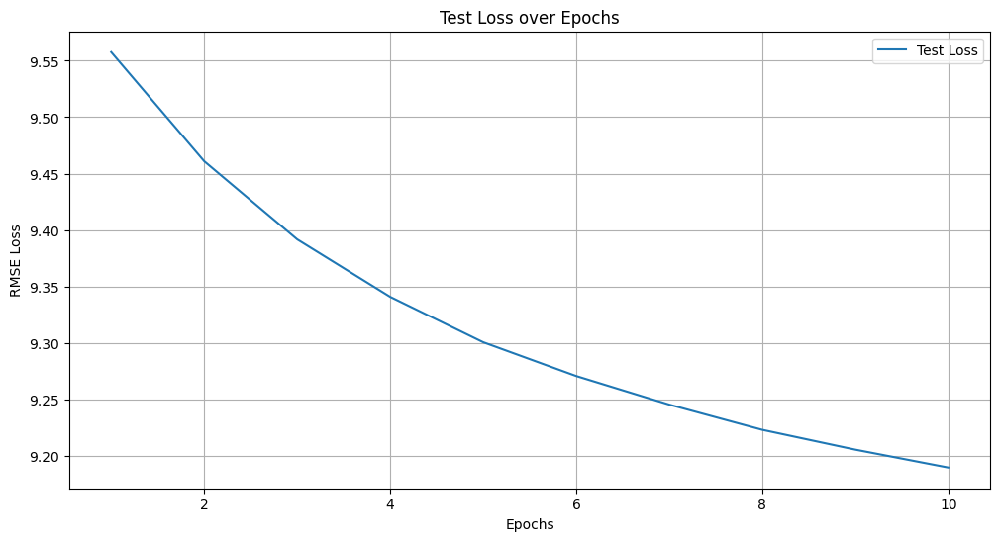

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([1999.7588, 1999.0582, 1997.0858,  ..., 1994.8943, 2000.3798,
        2000.6649])

In [ ]:
set_random_seed(42)
train(model2, optimizer, criterion, train_loader, test_loader, 10)
test(model2, criterion, test_loader)

# только не запускайте эту ячейку два раза подряд!! сначала запустите все до этого во 2 задании, чтобы модель не обучалась два раза сама на себе
# это супер очвеидно по идее, но я хотела поделиться своей травмой.. я сидела час на всех форумах, думая, что у меня код просто не воспроизводимый :)))))))

Ну какая красота!!! самым простым способом почти выбила четверку

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 9.25387591477668


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 9.142270782796464


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 9.076204540115771


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 9.021576560959957


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 8.985992831758933


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 8.954993726003288


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 8.92803393850232


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 8.90799481620883


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 8.892479219058952


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 8.87907213562786


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:11, rmse: 8.87051812374946


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:12, rmse: 8.859708640244929


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:13, rmse: 8.84898579356694


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:14, rmse: 8.839565139595825


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:15, rmse: 8.829753869830972


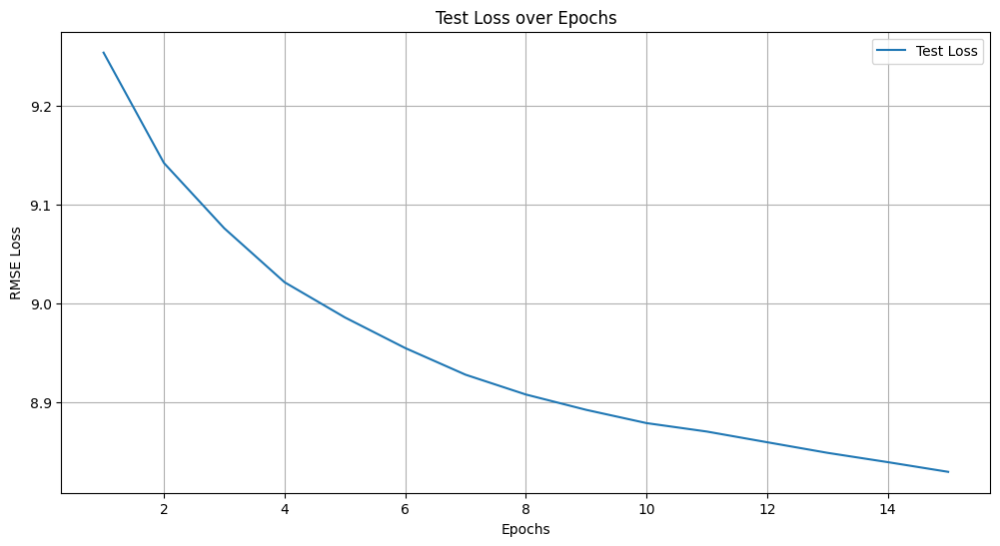

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([2000.6245, 1997.6101, 1997.5825,  ..., 2001.4071, 1999.8579,
        2001.8691])

In [ ]:
# ИЗМЕНИЛА ОПТИМИЗАТОР НА АДАМ + увеличила длину шага

model3 = LinearRegressionModel2().to(device)

optimizer2 = torch.optim.Adam(model3.parameters(), lr = 0.001, weight_decay=1e-4)
# https://www.projectpro.io/recipes/optimize-function-adam-pytorch - узнала как пользоваться Адамом
# добавлю weight decay как L2 регуляризацию весов. Добавляем штраф за бьльшие веса. https://medium.com/analytics-vidhya/deep-learning-basics-weight-decay-3c68eb4344e9

criterion2 = RMSELoss

train(model3, optimizer2, criterion2, train_loader, test_loader, 15)
test(model3, criterion2, test_loader)

как же я обожаю адам, он делает такую красоту.. К тому же, я еще добавила L2 регуляризацию, чтобы штрафовать за большие веса + уменьшила немного длину шагу (оптимальную вывела эмпирически ахахха)

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 9.239326464067592


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 9.149376448428276


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 9.085503723951849


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 9.044337649746696


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 9.010666392227211


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 8.977288483393075


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 8.957216767981501


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 8.926563633550511


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 8.918450868955933


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 8.904577110073355


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:11, rmse: 8.892889477828941


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:12, rmse: 8.892335618486499


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:13, rmse: 8.873418066171137


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:14, rmse: 8.870489060878754


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:15, rmse: 8.853179091274148


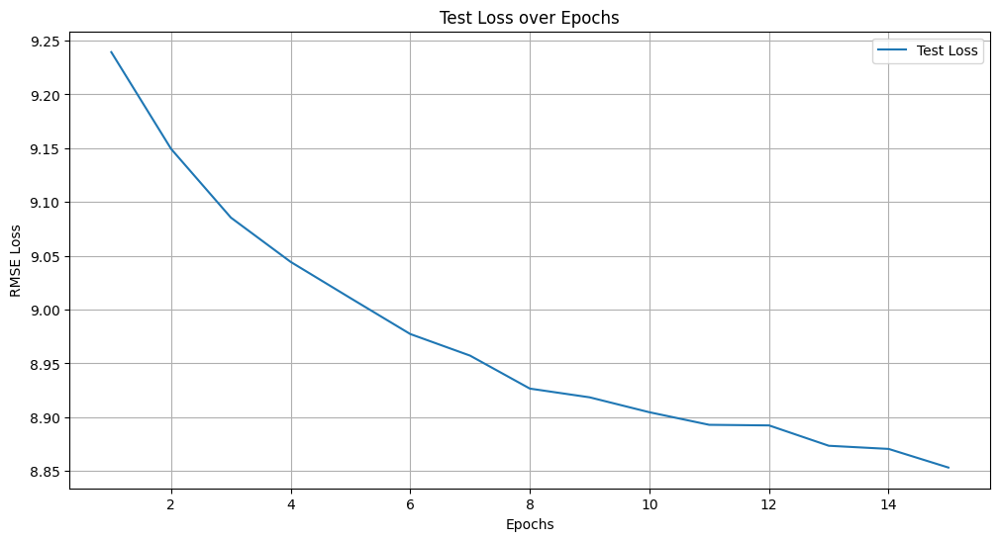

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([2000.9935, 1998.3394, 1997.5703,  ..., 2001.5443, 1999.2296,
        2001.7926])

In [ ]:
# И ЕЩЕ СВЕРХУ БАХАЮ ДРОПАУТ, чтобы модель не переобучалась

class LinearRegressionModel4(nn.Module):
    def __init__(self):
      super(LinearRegressionModel4, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.1)
      # я воспользовалась советом и добавила droupout регуляризацию
      # it will take the output from its previous layer, randomly select some of the neurons and zero them out before passing to the next layer, effectively ignored them
      # https://machinelearningmastery.com/using-dropout-regularization-in-pytorch-models/
      self.linear2 = nn.Linear(90,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      pred2 = self.dropout(pred2)
      return self.linear2(pred2)

set_random_seed(42)

model4 = LinearRegressionModel4().to(device)

optimizer3 = torch.optim.Adam(model4.parameters(), lr = 0.001, weight_decay=1e-4)

criterion3 = RMSELoss

train(model4, optimizer3, criterion3, train_loader, test_loader, 15)
test(model4, criterion3, test_loader)

Ну я так и знала, что качество не улучшиться, зато я могу гордиться тем, что делаю все, чтобы предотвратить переобучение!

  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:1, rmse: 8.89649668550373


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:2, rmse: 8.811915271039636


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:3, rmse: 8.752594551732463


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:4, rmse: 8.71404633539782


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:5, rmse: 8.685652920980903


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:6, rmse: 8.65700793059233


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:7, rmse: 8.650939779009477


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:8, rmse: 8.622906594950862


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:9, rmse: 8.609373082594008


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:10, rmse: 8.608600027212137


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:11, rmse: 8.589690590910521


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:12, rmse: 8.580440803142103


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:13, rmse: 8.572655645552699


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:14, rmse: 8.563562176067835


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:15, rmse: 8.560565706222288


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:16, rmse: 8.549651481969185


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:17, rmse: 8.554037200014289


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:18, rmse: 8.540375388585604


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:19, rmse: 8.536349858302929


  0%|          | 0/7245 [00:00<?, ?it/s]

  0%|          | 0/806 [00:00<?, ?it/s]

Epoch:20, rmse: 8.523582511445133


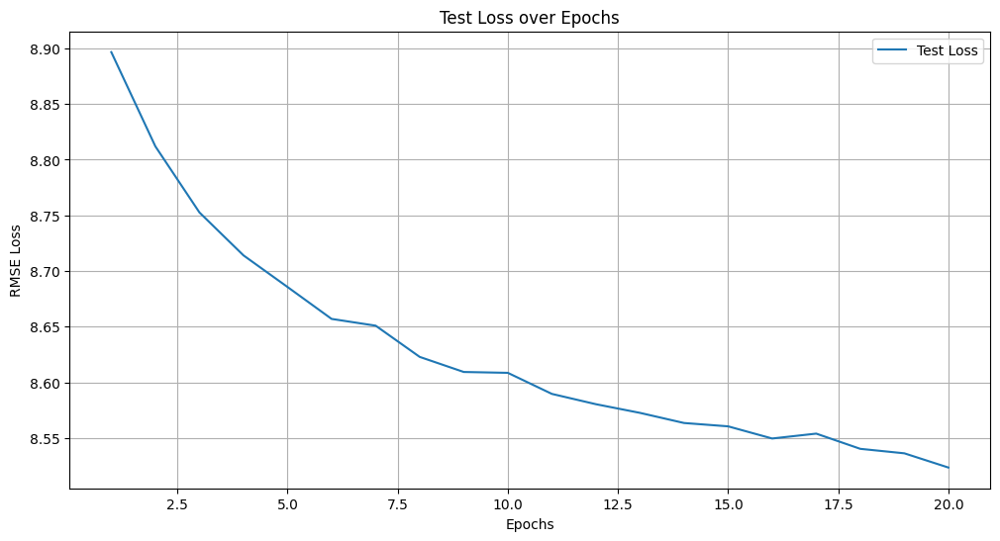

  0%|          | 0/806 [00:00<?, ?it/s]

tensor([2000.8536, 1999.6704, 1999.1227,  ..., 1996.8707, 1996.9279,
        1997.0967])

In [ ]:
# уменьшим батч + добавим количество эпох
train_loader_batch = DataLoader(train_set, batch_size=64, num_workers=0, pin_memory=True, worker_init_fn=_init_fn, drop_last=True)
test_loader_batch = DataLoader(test_set, batch_size=64, num_workers=0,  drop_last=True)
set_random_seed(42)

# я добавила параметр drop_last, потому что была ошибка ValueError: x and y must have same first dimension, but have shapes (10,) and (9,)
# я предположила, что это связано с тем, что последний батч меньше по размерам

model_batch = LinearRegressionModel4().to(device)

optimizer4 = torch.optim.Adam(model_batch.parameters(), lr = 0.001, weight_decay=1e-4)

criterion4 = RMSELoss

train(model_batch, optimizer4, criterion4, train_loader_batch, test_loader_batch, 20)
test(model_batch, criterion4, test_loader_batch)

Какая же красота получилась.. сама себе завидую!

In [ ]:
# 2 ВАРИАНТ

set_random_seed(42)
# для того, чтобы стандартизировать данные через пайторч, переводим нп.аррэи в тензоры
X_torch_train = torch.from_numpy(X_train).float()
y_torch_train = torch.from_numpy(y_train).float()

X_torch_test = torch.from_numpy(X_test).float()
y_torch_test = torch.from_numpy(y_test).float()

# нормализация признаков
# https://www.geeksforgeeks.org/how-to-normalize-a-tensor-to-0-mean-and-1-variance-in-pytorch/

mean_X, std_X = torch.mean(X_torch_train), torch.std(X_torch_train)
mean_y, std_y = torch.mean(y_torch_train), torch.std(y_torch_train)

mean_X = torch.tensor(mean_X, dtype=torch.float32)
std_X = torch.tensor(std_X, dtype=torch.float32)
mean_y = torch.tensor(mean_y, dtype=torch.float32)
std_y = torch.tensor(std_y, dtype=torch.float32)

X_torch_train_norm = (X_torch_train-mean_X)/std_X
X_torch_test_norm = (X_torch_test-mean_X)/std_X

y_torch_train_norm = (y_torch_train-mean_y)/std_y
y_torch_test_norm = (y_torch_test-mean_y)/std_y

set_random_seed(42)

def _init_fn(worker_id):
    np.random.seed(int(42))

train_set = MyDataset(X_torch_train_norm, y_torch_train_norm)
train_loader = DataLoader(train_set, batch_size = 128, num_workers=0,  pin_memory=True, worker_init_fn=_init_fn) # решила взять оптимальное, часто такое видела в кодах
# https://discuss.pytorch.org/t/random-seed-initialization/7854/15

test_set = MyDataset(X_torch_test_norm, y_torch_test_norm)
test_loader = DataLoader(test_set, batch_size = 128, num_workers=0)

set_random_seed(42)
# начинаю с очень базовой модели, состоящей из линейного слоя, слоя активации и предсказания модели

class LinearRegressionModel2(nn.Module):
    def __init__(self):
      super(LinearRegressionModel2, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.linear2 = nn.Linear(90,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      return self.linear2(pred2)

model2 = LinearRegressionModel2()
model2.to(device)

learning_rate = 0.0001
# https://stackoverflow.com/questions/42966393/is-it-good-learning-rate-for-adam-method

optimizer = torch.optim.SGD(model2.parameters(), momentum=0.8)

# def RMSELoss(yhat,y):
#     return torch.sqrt(torch.mean((yhat-y)**2))

# criterion = RMSELoss
# https://discuss.pytorch.org/t/rmse-loss-function/16540/3

criterion = nn.MSELoss()

<ipython-input-14-cc7d525f7b4e>:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean_X = torch.tensor(mean_X, dtype=torch.float32)
<ipython-input-14-cc7d525f7b4e>:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  std_X = torch.tensor(std_X, dtype=torch.float32)
<ipython-input-14-cc7d525f7b4e>:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean_y = torch.tensor(mean_y, dtype=torch.float32)
<ipython-input-14-cc7d525f7b4e>:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceT

In [ ]:
def train(model, optimizer, criterion, train_loader, test_loader, n_epochs):
    """
    params:
        model - torch.nn.Module to be fitted
        optimizer - model optimizer
        criterion - loss function from torch.nn
        train_loader - torch.utils.data.Dataloader with train set
        test_loader - torch.utils.data.Dataloader with test set
                      (if you wish to validate during training)
    """
    all_rmse = []

    for epoch in range(n_epochs):

      rmse_test = 0

      model.train()
      for batch in tqdm(train_loader):
        x_train = batch["sample"].to(device)
        y_train = batch["target"].view(-1, 1).to(device)
        y_train_pred = model(x_train).to(device)
        train_loss = criterion(y_train_pred, y_train.to(device))
        model.zero_grad()
        # но я нашла, что можно и optimizer.zero_grad(), потом решу, что лучше (говорят, работают одинаково)
        # https://discuss.pytorch.org/t/model-zero-grad-or-optimizer-zero-grad/28426/4
        train_loss.backward()
        optimizer.step()

      model.eval()
      with torch.no_grad():
        for batch in tqdm(test_loader):
          x_test = batch["sample"].to(device)
          y_test = batch["target"].view(-1, 1).to(device)
          y_test_pred = model(x_test).to(device)
          y_test_pred_denorm = y_test_pred * std_y + mean_y
          y_test_denorm = y_test * std_y + mean_y
          test_loss = criterion(y_test_pred_denorm, y_test_denorm.to(device))
          rmse_test += test_loss.item()

      avg_test_loss = rmse_test / len(test_loader)
      # https://pytorch.org/tutorials/beginner/basics/optimization_tutorial.html
      all_rmse.append(torch.sqrt(torch.tensor(avg_test_loss)))
      torch.save(model.state_dict(), 'model_weights.pth')
      # https://pytorch.org/tutorials/beginner/basics/saveloadrun_tutorial.html
      print (f'Epoch:{epoch+1}, rmse: {torch.sqrt(torch.tensor(avg_test_loss))}')

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, n_epochs + 1), all_rmse, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Test Loss over Epochs')
    plt.legend()
    plt.grid()
    plt.show()


def test(model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """

    model.eval()
    all_predictions = []

    with torch.no_grad():
        for batch in tqdm(test_loader):
          x_test = batch["sample"].to(device)
          y_test = batch["target"].view(-1, 1).to(device)
          y_test_pred = model(x_test).to(device)
          y_test_pred_denorm = y_test_pred * std_y + mean_y
          all_predictions.append(y_test_pred_denorm)

    predicts = torch.cat(all_predictions).view(-1)
    # torch.FloatTensor(all_predictions).view_as(torch.ones(len(test_loader.dataset)))
    return predicts

In [ ]:
assert test(model2, criterion, test_loader).shape[0] == y_test.shape[0]

  0%|          | 0/404 [00:00<?, ?it/s]

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 10.363152503967285


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 10.226577758789062


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 10.14847469329834


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 10.096609115600586


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 10.057409286499023


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 10.025667190551758


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 9.999468803405762


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 9.977309226989746


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 9.961381912231445


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 9.946429252624512


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:11, rmse: 9.929469108581543


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:12, rmse: 9.918787956237793


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:13, rmse: 9.905838012695312


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:14, rmse: 9.892502784729004


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:15, rmse: 9.880731582641602


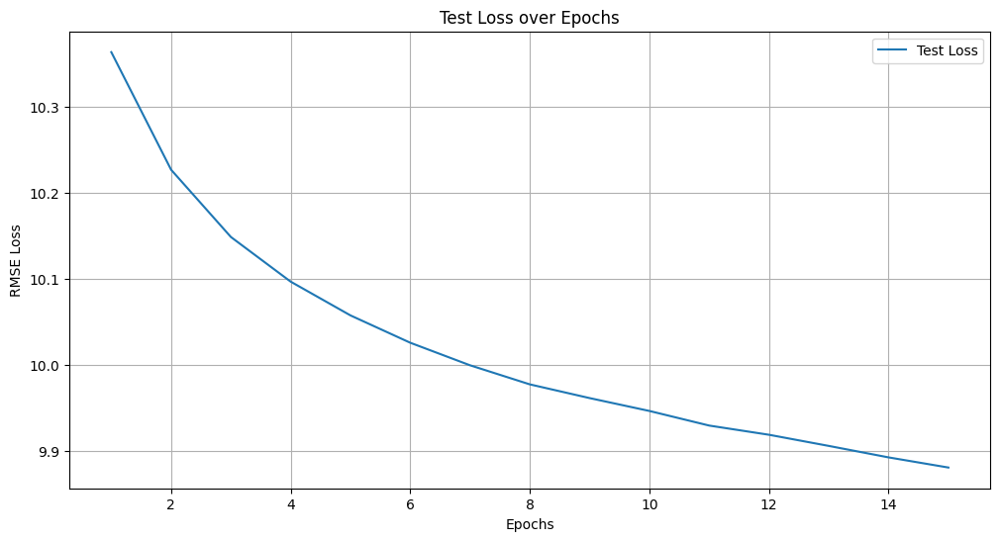

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([1999.2800, 1997.2107, 1994.7496,  ..., 1994.9729, 1998.5620,
        2000.9424], device='cuda:0')

In [ ]:
set_random_seed(42)
train(model2, optimizer, criterion, train_loader, test_loader, 15)
test(model2, criterion, test_loader)

# только не запускайте эту ячейку два раза подряд!! сначала запустите все до этого во 2 задании, чтобы модель не обучалась два раза сама на себе
# это супер очвеидно по идее, но я хотела поделиться своей травмой.. я сидела час на всех форумах, думая, что у меня код просто не воспроизводимый :)))))))

Я сначала суммировала ошибки рмсе сразу, и вышло такое идельное качество (с первой модели 9 было в 10 эпохе), но почитала беседу и исправила код... ну получилось, как получилось

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 10.044021606445312


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 9.92199993133545


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 9.843488693237305


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 9.784575462341309


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 9.743858337402344


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 9.712454795837402


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 9.684919357299805


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 9.666922569274902


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 9.644842147827148


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 9.629761695861816


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:11, rmse: 9.61310863494873


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:12, rmse: 9.600983619689941


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:13, rmse: 9.588739395141602


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:14, rmse: 9.579139709472656


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:15, rmse: 9.569644927978516


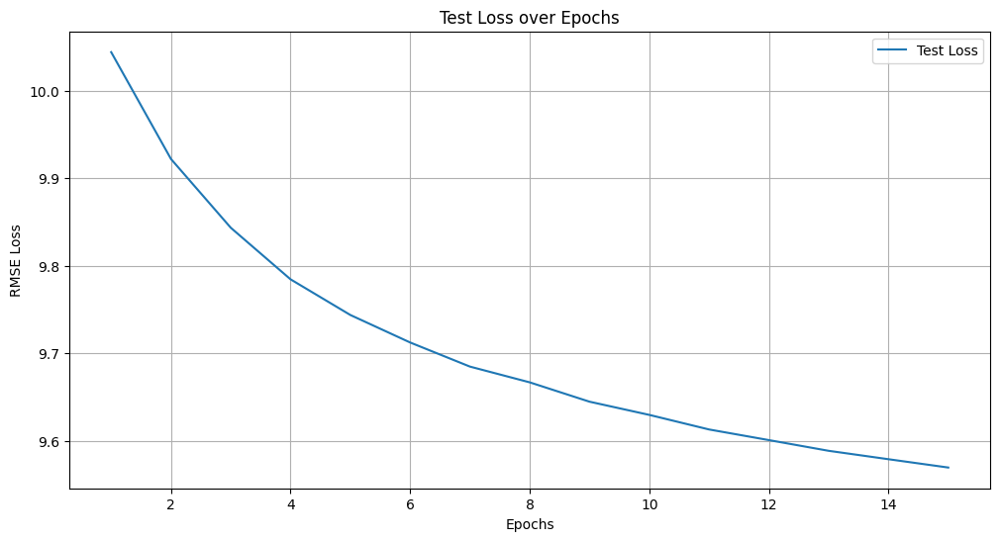

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([2001.3439, 1996.7974, 1995.5026,  ..., 2002.9607, 2000.4625,
        2001.5098], device='cuda:0')

In [ ]:
# ИЗМЕНИЛА ОПТИМИЗАТОР НА АДАМ + увеличила длину шага

set_random_seed(42)
class LinearRegressionModel3(nn.Module):
    def __init__(self):
      super(LinearRegressionModel3, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.linear2 = nn.Linear(90,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      # pred2 = self.dropout(pred2)
      return self.linear2(pred2)

model3 = LinearRegressionModel3().to(device)

optimizer2 = torch.optim.Adam(model3.parameters(), lr = 0.001, weight_decay=1e-4)
# https://www.projectpro.io/recipes/optimize-function-adam-pytorch - узнала как пользоваться Адамом
# добавлю weight decay как L2 регуляризацию весов. Добавляем штраф за бьльшие веса. https://medium.com/analytics-vidhya/deep-learning-basics-weight-decay-3c68eb4344e9

criterion2 = nn.MSELoss()

train(model3, optimizer2, criterion2, train_loader, test_loader, 15)
test(model3, criterion2, test_loader)

я обожаю Адам! он прямо выдает замечательные предсказания, и обучается быстрее, чем СГД в моем случае. на контрасте: у Адама на 4 эпохе результат лучше, чем у СГД на 15.

In [ ]:
class LinearRegressionModel4(nn.Module):
    def __init__(self):
      super(LinearRegressionModel4, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.1)
      # я воспользовалась советом и добавила droupout регуляризацию
      # it will take the output from its previous layer, randomly select some of the neurons and zero them out before passing to the next layer, effectively ignored them
      # https://machinelearningmastery.com/using-dropout-regularization-in-pytorch-models/
      self.linear2 = nn.Linear(90,1)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      pred2 = self.dropout(pred2)
      return self.linear2(pred2)

  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:1, rmse: 10.045302391052246


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:2, rmse: 9.929903030395508


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:3, rmse: 9.869318962097168


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:4, rmse: 9.80978775024414


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:5, rmse: 9.759977340698242


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:6, rmse: 9.735713958740234


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:7, rmse: 9.709555625915527


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:8, rmse: 9.673599243164062


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:9, rmse: 9.672593116760254


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:10, rmse: 9.651586532592773


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:11, rmse: 9.634671211242676


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:12, rmse: 9.63403034210205


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:13, rmse: 9.615407943725586


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:14, rmse: 9.60300064086914


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:15, rmse: 9.60954761505127


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:16, rmse: 9.59328556060791


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:17, rmse: 9.583427429199219


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:18, rmse: 9.57336139678955


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:19, rmse: 9.572239875793457


  0%|          | 0/3623 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

Epoch:20, rmse: 9.553092956542969


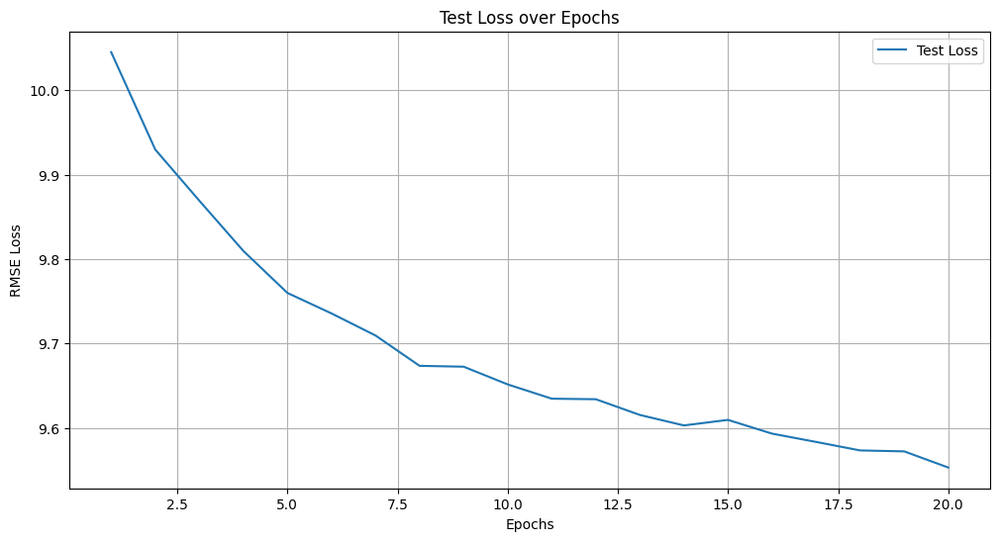

  0%|          | 0/404 [00:00<?, ?it/s]

tensor([2000.5659, 1996.7035, 1996.5394,  ..., 2002.9248, 2000.2495,
        2001.7706], device='cuda:0')

In [ ]:
# И ЕЩЕ СВЕРХУ БАХАЮ ДРОПАУТ, чтобы модель не переобучалась + добавлю больше эпох

set_random_seed(42)

model4 = LinearRegressionModel4().to(device)

optimizer3 = torch.optim.Adam(model4.parameters(), lr = 0.001, weight_decay=1e-4)

criterion3 = nn.MSELoss()

train(model4, optimizer3, criterion3, train_loader, test_loader, 20)
test(model4, criterion3, test_loader)

надежд на то, что модель сильно улучшится, и не было особо (хотя и подбирала  p = probability of an element to be zeroed, т.к. при дефолтном 0.5 было так себе, но результат менялся не сильно. в итоге оставила 0.1 как лучший), в конце концов dropout нужен, чтобы переобучение снизить. тем не менее добавление эпох немножко скрасило картину, мне осталось всего 0.55 до четверкиии

In [ ]:
# увеличим батч + добавим эпох
train_loader_batch = DataLoader(train_set, batch_size=256, num_workers=0, pin_memory=True, worker_init_fn=_init_fn, drop_last=True)
test_loader_batch = DataLoader(test_set, batch_size=256, num_workers=0,  drop_last=True)

  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:1, rmse: 9.94997787475586


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:2, rmse: 9.816153526306152


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:3, rmse: 9.735658645629883


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:4, rmse: 9.68248462677002


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:5, rmse: 9.637493133544922


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:6, rmse: 9.609477043151855


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:7, rmse: 9.580633163452148


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:8, rmse: 9.550031661987305


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:9, rmse: 9.536035537719727


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:10, rmse: 9.516542434692383


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:11, rmse: 9.499253273010254


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:12, rmse: 9.485066413879395


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:13, rmse: 9.484696388244629


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:14, rmse: 9.468094825744629


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:15, rmse: 9.457937240600586


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:16, rmse: 9.451481819152832


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:17, rmse: 9.437255859375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:18, rmse: 9.425094604492188


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:19, rmse: 9.420876502990723


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:20, rmse: 9.412602424621582


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:21, rmse: 9.407291412353516


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:22, rmse: 9.393081665039062


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:23, rmse: 9.39635181427002


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:24, rmse: 9.386763572692871


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:25, rmse: 9.385895729064941


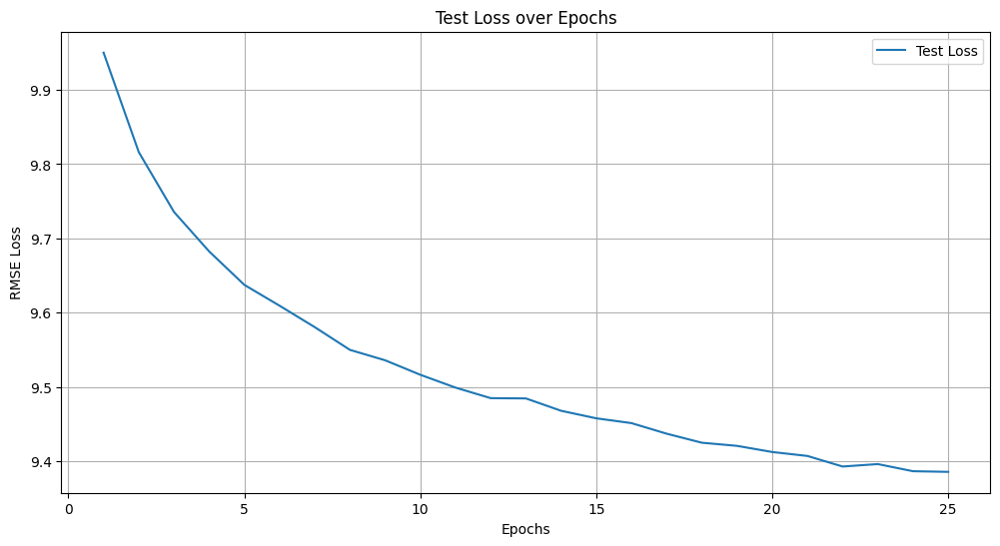

  0%|          | 0/201 [00:00<?, ?it/s]

tensor([1999.9929, 1997.5072, 1997.0244,  ..., 2011.7144, 1996.8229,
        1994.3956], device='cuda:0')

In [ ]:
set_random_seed(42)

# я добавила параметр drop_last, потому что была ошибка ValueError: x and y must have same first dimension, but have shapes (10,) and (9,)
# я предположила, что это связано с тем, что последний батч меньше по размерам

model_batch = LinearRegressionModel4().to(device)

optimizer4 = torch.optim.Adam(model_batch.parameters(), lr = 0.001, weight_decay=1e-4)

criterion4 = nn.MSELoss()

train(model_batch, optimizer4, criterion4, train_loader_batch, test_loader_batch, 25)
test(model_batch, criterion4, test_loader_batch)

фух, я очень рада, что наконец начали происходить улучшения благодаря увеличению батча, потому что до этого я все игралась (и уменьшала, и увеличивала) с длиной шага, но все без толку было. + добавила количества эпох просто чтобы глянуть, как будет изменяться ошибка, и есть ли смысл добавлять еще эпох, или ошибка просто будет незначительно колебаться. но по итогу это стоило того, хотя и изменения иногда были довольно мизерными

  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:1, rmse: 9.941230773925781


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:2, rmse: 9.812410354614258


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:3, rmse: 9.72324275970459


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:4, rmse: 9.661584854125977


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:5, rmse: 9.617093086242676


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:6, rmse: 9.586023330688477


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:7, rmse: 9.558734893798828


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:8, rmse: 9.527873039245605


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:9, rmse: 9.500962257385254


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:10, rmse: 9.487651824951172


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:11, rmse: 9.47241497039795


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:12, rmse: 9.451940536499023


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:13, rmse: 9.4417724609375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:14, rmse: 9.431171417236328


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:15, rmse: 9.415690422058105


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:16, rmse: 9.404284477233887


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:17, rmse: 9.394959449768066


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:18, rmse: 9.381381034851074


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:19, rmse: 9.37537956237793


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:20, rmse: 9.36372184753418


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:21, rmse: 9.351521492004395


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:22, rmse: 9.345894813537598


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:23, rmse: 9.344165802001953


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:24, rmse: 9.34229564666748


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:25, rmse: 9.329493522644043


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:26, rmse: 9.316757202148438


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:27, rmse: 9.314370155334473


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:28, rmse: 9.304309844970703


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:29, rmse: 9.298887252807617


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:30, rmse: 9.288333892822266


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:31, rmse: 9.291180610656738


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:32, rmse: 9.279546737670898


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:33, rmse: 9.278826713562012


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:34, rmse: 9.271188735961914


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:35, rmse: 9.268570899963379


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:36, rmse: 9.261787414550781


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:37, rmse: 9.259961128234863


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:38, rmse: 9.25415325164795


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:39, rmse: 9.241364479064941


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:40, rmse: 9.237895965576172


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:41, rmse: 9.227117538452148


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:42, rmse: 9.224432945251465


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:43, rmse: 9.216140747070312


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:44, rmse: 9.211774826049805


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:45, rmse: 9.202437400817871


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:46, rmse: 9.203906059265137


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:47, rmse: 9.19790267944336


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:48, rmse: 9.193116188049316


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:49, rmse: 9.189275741577148


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:50, rmse: 9.186992645263672


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:51, rmse: 9.185420036315918


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:52, rmse: 9.171239852905273


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:53, rmse: 9.17845344543457


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:54, rmse: 9.175890922546387


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:55, rmse: 9.169258117675781


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:56, rmse: 9.154861450195312


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:57, rmse: 9.16380500793457


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:58, rmse: 9.136998176574707


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:59, rmse: 9.142475128173828


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:60, rmse: 9.144989013671875


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:61, rmse: 9.137596130371094


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:62, rmse: 9.137370109558105


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:63, rmse: 9.13503360748291


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:64, rmse: 9.125494003295898


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:65, rmse: 9.124887466430664


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:66, rmse: 9.119863510131836


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:67, rmse: 9.12393569946289


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:68, rmse: 9.120062828063965


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:69, rmse: 9.11291790008545


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:70, rmse: 9.106532096862793


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:71, rmse: 9.101152420043945


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:72, rmse: 9.10281753540039


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:73, rmse: 9.103826522827148


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:74, rmse: 9.100196838378906


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:75, rmse: 9.108777046203613


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:76, rmse: 9.10123062133789


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:77, rmse: 9.100829124450684


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:78, rmse: 9.085721969604492


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:79, rmse: 9.087386131286621


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:80, rmse: 9.08409309387207


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:81, rmse: 9.078263282775879


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:82, rmse: 9.083573341369629


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:83, rmse: 9.067481994628906


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:84, rmse: 9.081387519836426


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:85, rmse: 9.067474365234375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:86, rmse: 9.074106216430664


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:87, rmse: 9.070558547973633


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:88, rmse: 9.074502944946289


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:89, rmse: 9.06446647644043


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:90, rmse: 9.061673164367676


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:91, rmse: 9.0529203414917


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:92, rmse: 9.051107406616211


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:93, rmse: 9.042266845703125


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:94, rmse: 9.048492431640625


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:95, rmse: 9.061062812805176


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:96, rmse: 9.06275463104248


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:97, rmse: 9.047554969787598


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:98, rmse: 9.043532371520996


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:99, rmse: 9.03929328918457


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:100, rmse: 9.036006927490234


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:101, rmse: 9.030661582946777


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:102, rmse: 9.029886245727539


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:103, rmse: 9.031614303588867


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:104, rmse: 9.032350540161133


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:105, rmse: 9.033638000488281


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:106, rmse: 9.024030685424805


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:107, rmse: 9.032466888427734


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:108, rmse: 9.021829605102539


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:109, rmse: 9.01646614074707


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:110, rmse: 9.023796081542969


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:111, rmse: 9.012091636657715


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:112, rmse: 9.017812728881836


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:113, rmse: 9.016146659851074


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:114, rmse: 9.015595436096191


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:115, rmse: 9.012818336486816


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:116, rmse: 9.014270782470703


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:117, rmse: 9.014484405517578


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:118, rmse: 9.009142875671387


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:119, rmse: 9.007670402526855


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:120, rmse: 9.008466720581055


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:121, rmse: 9.008821487426758


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:122, rmse: 9.002914428710938


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:123, rmse: 9.015972137451172


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:124, rmse: 9.002114295959473


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:125, rmse: 9.006933212280273


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:126, rmse: 8.999309539794922


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:127, rmse: 9.013053894042969


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:128, rmse: 8.999431610107422


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:129, rmse: 8.995929718017578


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:130, rmse: 9.00233268737793


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:131, rmse: 8.992199897766113


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:132, rmse: 8.995500564575195


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:133, rmse: 8.981348991394043


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:134, rmse: 8.979837417602539


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:135, rmse: 8.988040924072266


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:136, rmse: 8.989330291748047


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:137, rmse: 8.9913911819458


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:138, rmse: 8.998353958129883


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:139, rmse: 8.998690605163574


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:140, rmse: 8.989669799804688


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:141, rmse: 8.989599227905273


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:142, rmse: 8.98507308959961


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:143, rmse: 8.993873596191406


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:144, rmse: 8.985429763793945


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:145, rmse: 8.972460746765137


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:146, rmse: 8.991010665893555


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:147, rmse: 9.0


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:148, rmse: 8.983077049255371


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:149, rmse: 8.981781959533691


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:150, rmse: 8.981114387512207


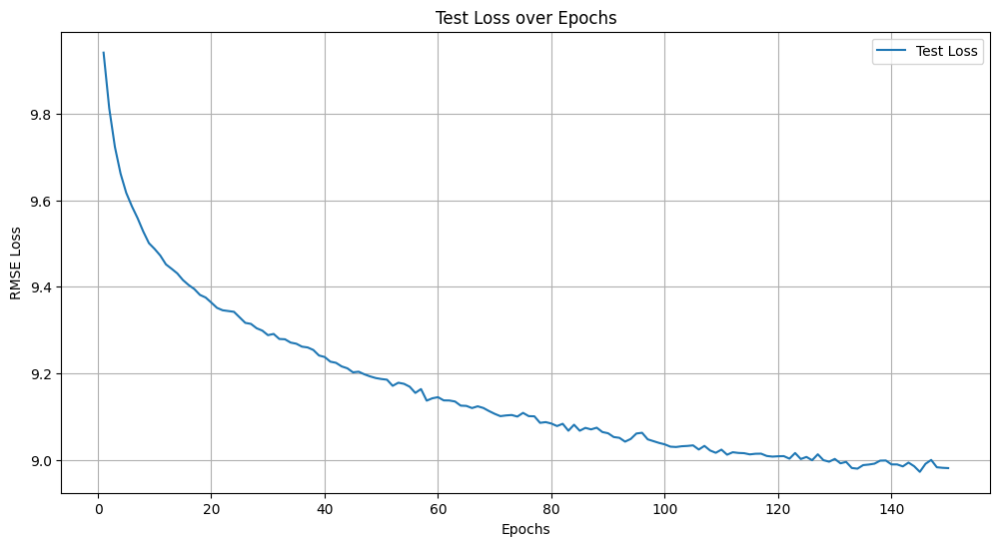

  0%|          | 0/201 [00:00<?, ?it/s]

tensor([1998.1438, 1999.7018, 1998.6332,  ..., 2019.4060, 2000.1685,
        1994.2681])

In [ ]:
# решила изменить оптимизатор

set_random_seed(42)

model_batch_2 = LinearRegressionModel4().to(device)

optimizer5 = torch.optim.AdamW(model_batch_2.parameters(), lr = 0.001, weight_decay=0.001)

criterion5 = nn.MSELoss()

train(model_batch_2, optimizer5, criterion5, train_loader_batch, test_loader_batch, 150)
test(model_batch_2, criterion5, test_loader_batch)

Измененила сразу и weight_decay вместе с оптимизатором, потому что при прежнем значении ничего особо не менялось. С увеличенным вейт декэем все стало хотя и не сильно, но получше
+сильно увеличила все же количество эпох. раз в прошлый раз это было такой полезной фичей, то и сейчас должно было помочь. ну зато наконец получила четверку!..

Но в целом моя проблема была в том, что после определенного слоя модель даже особо не меняется, мне надо было стабилизировать работу. Я много гуглила, тсетила, расширяла архитектуру... в итоге обратилась к batch-normalization в надежде, что это поможет:

- https://neerc.ifmo.ru/wiki/index.php?title=Batch-normalization
- https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html

In [ ]:
class LinearRegressionModel5(nn.Module):
    def __init__(self):
        super(LinearRegressionModel5, self).__init__()
        self.linear1 = nn.Linear(90, 128)
        self.relu = nn.ReLU()
        self.dropout1 = nn.Dropout(0.1)
        self.bn1 = nn.BatchNorm1d(128)
        self.linear2 = nn.Linear(128, 128)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.2)
        self.bn2 = nn.BatchNorm1d(128)
        self.linear3 = nn.Linear(128, 1)

    def forward(self, x):
      pred = self.linear1(x)
      pred = self.relu(pred)
      pred = self.dropout1(pred)
      pred = self.bn1(pred)
      pred = self.linear2(pred)
      pred = self.relu(pred)
      pred = self.dropout2(pred)
      pred = self.bn2(pred)
      return self.linear3(pred)

In [ ]:
train_loader_arc = DataLoader(train_set, batch_size=256, num_workers=0, pin_memory=True, worker_init_fn=_init_fn, drop_last=True)
test_loader_arc = DataLoader(test_set, batch_size=256, num_workers=0,  drop_last=True)

  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:1, rmse: 10.01392650604248


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:2, rmse: 9.854021072387695


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:3, rmse: 9.753046989440918


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:4, rmse: 9.674607276916504


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:5, rmse: 9.600902557373047


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:6, rmse: 9.5520601272583


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:7, rmse: 9.50204849243164


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:8, rmse: 9.465997695922852


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:9, rmse: 9.433439254760742


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:10, rmse: 9.40472412109375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:11, rmse: 9.377519607543945


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:12, rmse: 9.350890159606934


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:13, rmse: 9.330034255981445


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:14, rmse: 9.30288314819336


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:15, rmse: 9.277030944824219


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:16, rmse: 9.261946678161621


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:17, rmse: 9.235978126525879


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:18, rmse: 9.216479301452637


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:19, rmse: 9.205208778381348


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:20, rmse: 9.186481475830078


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:21, rmse: 9.173762321472168


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:22, rmse: 9.15695571899414


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:23, rmse: 9.14229679107666


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:24, rmse: 9.124398231506348


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:25, rmse: 9.115922927856445


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:26, rmse: 9.096609115600586


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:27, rmse: 9.078851699829102


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:28, rmse: 9.07099723815918


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:29, rmse: 9.06017780303955


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:30, rmse: 9.042195320129395


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:31, rmse: 9.030945777893066


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:32, rmse: 9.020380020141602


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:33, rmse: 9.019688606262207


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:34, rmse: 9.009445190429688


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:35, rmse: 9.000606536865234


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:36, rmse: 8.993941307067871


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:37, rmse: 8.98978042602539


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:38, rmse: 8.98137092590332


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:39, rmse: 8.96786117553711


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:40, rmse: 8.964080810546875


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:41, rmse: 8.955183982849121


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:42, rmse: 8.9536714553833


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:43, rmse: 8.952340126037598


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:44, rmse: 8.9486083984375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:45, rmse: 8.936185836791992


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:46, rmse: 8.937788009643555


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:47, rmse: 8.93176555633545


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:48, rmse: 8.922520637512207


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:49, rmse: 8.924799919128418


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:50, rmse: 8.915990829467773


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:51, rmse: 8.91993522644043


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:52, rmse: 8.913009643554688


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:53, rmse: 8.920012474060059


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:54, rmse: 8.920965194702148


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:55, rmse: 8.92396354675293


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:56, rmse: 8.909820556640625


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:57, rmse: 8.90432357788086


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:58, rmse: 8.906739234924316


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:59, rmse: 8.895232200622559


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:60, rmse: 8.906082153320312


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:61, rmse: 8.902012825012207


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:62, rmse: 8.901646614074707


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:63, rmse: 8.905924797058105


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:64, rmse: 8.905712127685547


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:65, rmse: 8.897539138793945


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:66, rmse: 8.898853302001953


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:67, rmse: 8.891085624694824


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:68, rmse: 8.903487205505371


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:69, rmse: 8.895193099975586


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:70, rmse: 8.896761894226074


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:71, rmse: 8.898037910461426


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:72, rmse: 8.89208984375


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:73, rmse: 8.883498191833496


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:74, rmse: 8.89633560180664


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:75, rmse: 8.881872177124023


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:76, rmse: 8.88033676147461


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:77, rmse: 8.883564949035645


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:78, rmse: 8.89786434173584


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:79, rmse: 8.882771492004395


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:80, rmse: 8.891980171203613


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:81, rmse: 8.894584655761719


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:82, rmse: 8.890646934509277


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:83, rmse: 8.889951705932617


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:84, rmse: 8.878715515136719


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:85, rmse: 8.88437557220459


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:86, rmse: 8.900408744812012


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:87, rmse: 8.87905216217041


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:88, rmse: 8.896829605102539


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:89, rmse: 8.885746002197266


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:90, rmse: 8.884478569030762


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:91, rmse: 8.898924827575684


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:92, rmse: 8.888145446777344


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:93, rmse: 8.92471981048584


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:94, rmse: 8.911392211914062


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:95, rmse: 8.889360427856445


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:96, rmse: 8.884539604187012


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:97, rmse: 8.889566421508789


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:98, rmse: 8.895005226135254


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:99, rmse: 8.876814842224121


  0%|          | 0/1811 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

Epoch:100, rmse: 8.891603469848633


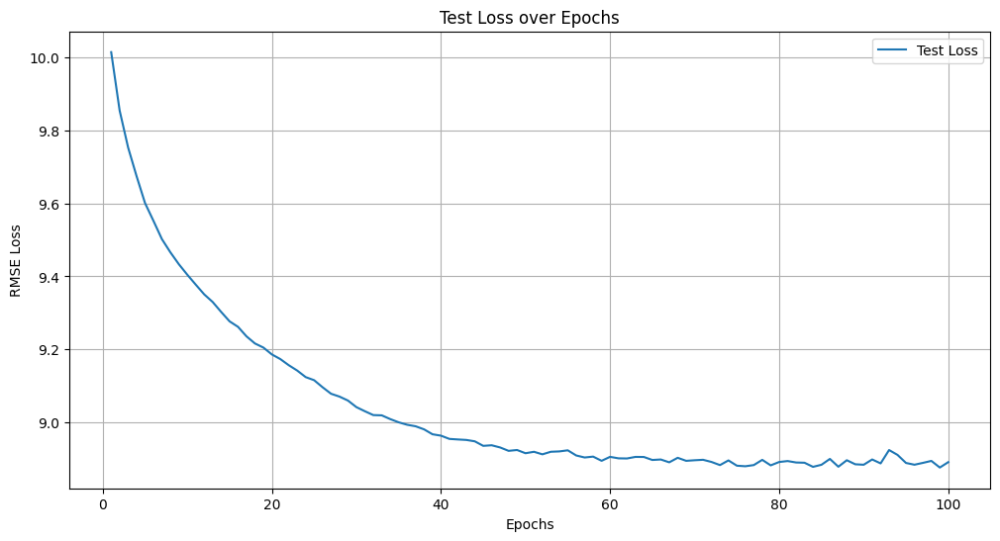

  0%|          | 0/201 [00:00<?, ?it/s]

tensor([1999.3456, 2003.0964, 2000.4052,  ..., 2008.7268, 1998.8108,
        1992.2686])

In [ ]:
set_random_seed(42)

model_batch_3 = LinearRegressionModel5().to(device)

optimizer6 = torch.optim.Adam(model_batch_3.parameters(), lr = 0.0001, weight_decay=0.0001)
criterion6 = nn.MSELoss()
train(model_batch_3, optimizer6, criterion6, train_loader_arc, test_loader_arc, 100)
test(model_batch_3, criterion6, test_loader_arc)

Господи, всеми правдами и неправдами, мне удалось получить 6 (66 эпоха), но ниже 8.88 так и не упало.. магическое число какое-то

## Задание 3. (0 баллов, но при невыполнении максимум за все задание &mdash; 0 баллов)

Напишите небольшой отчет о том, как вы добились полученного качества: какие средства использовали и какие эксперименты проводили. Подробно расскажите об архитектурах и значениях гиперпараметров, а также какие метрики на тесте они показывали. Чтобы отчет был зачтен, необходимо привести хотя бы 3 эксперимента.

# 1 ВАРИАНТ

И так, самое лучшее качество я получила благодаря модели model_batch: ~8.52, но начну объяснение по порядку.

1: я обучила самую простую модель (model2), состоящую из линейного слоя, слоя активации и предсказания модели, благодаря оптимизатору SGD и довольно маленькому шагу (0.0001 - я положилась на советы из интернета). Тем не менее эта модель оказалась на удивление очень удачной, на последней эпохе RMSE был 9.18. Конечно, я была уже очень рада и решила обучить еще несколько моделей для того, чтобы испытать улучшения на практике.

2: заменила оптимизатор на Adam + добавила weight decay как L2 регуляризацию весов (параметр Адама) для введения штрафа за большие веса -> предотвращение переобучения + увеличила количество эпох (до 15) + увеличила длину шага в 10 раз. RMSE на последней эпохе: 8.83

3: добавила DropOut как один слоев модели для случайного отключения нейронов в слое. Она не особо помогла именно в уменьшении ошибки, зато помогла с переобучением, rmse все так же: 8.83. Я долго игралась с probability of an element to be zeroed (при дефолтном 0.5 было так себе) - чекала при 0.1, 0.2, 0.3. У меня к тому моменту уже закончилось ГПУ, так что было долговато. В итоге пришла к выводу, что наилучший результат дает p = 0.1

4: раз я уже начала играться с гиперпараметрами, то стоило и проверить изменение размера батча. Фух, эта было трудно. Каждый раз вылезала ошибка ValueError: x and y must have same first dimension, but have shapes (10,) and (9,) из-за того, что последний батч меньше по размерам. В итоге я подобрала оптимальный размер (64) + добавила drop_last=True на основе рекомендаций с гитхаба. И вот по итогу получилось шикарное rmse: 8.52.

P.S. ну и напоследок я увеличила количество эпох до 15, ведь если за 10 эпох удалось дойти до 8.48, то можно и попробовать еще чуть-чуть улучшить качество. Изменения уже шли очень медленно после 11 эпохи. Итог: 8.449. К сожалению, график не отобразился, поэтому я удалила эту ячейку, но скриншот прикрепляю, пусть это будет допом к заданию

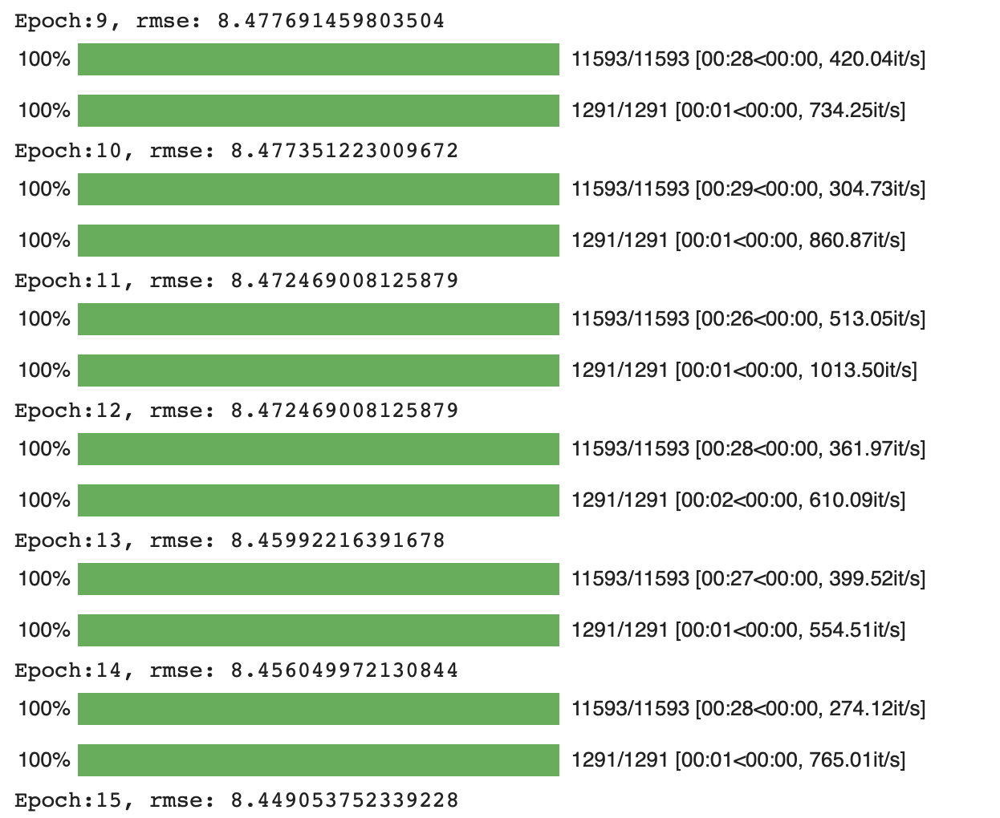

2 ВАРИАНТ

Здесь уже сложнее..

1) начала все с той же простой архитектуры модели, что и в прошлый раз:

class LinearRegressionModel2(nn.Module):
    def __init__(self):
      super(LinearRegressionModel2, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.linear2 = nn.Linear(90,1)


learning_rate = 0.0001
взяла оптимизатор SGD с моментумом 0.8
обучаюсь на 15 эпохах
128 батч -> ошибка 9.88


2) изменила оптимизатор на адам, увеличила длину шага в 10 раз,
добавила L2 регуляризацию (weight_decay=1e-4) -> ошибка чуть-чуть уменьшилась(до 9.56)


3) добавила дропаут 0.1 - ничего не поменялось в плане ошибки, но я и не ждала. Из новшеств еще: Увеличила батч до 256. Обучала на 25 эпохах.

4) Самое главное - изменила оптимизатор на AdamW, уменьшила weight_decay ( 0.001). С увеличенным вейт декэем все стало хотя и не сильно, но получше + решила играть по-крупному, увеличила количество эпох в несколько раз (теперь их 150). Я решила, что если в прошлый раз это было такой полезной фичей, то и сейчас должно было помочь -> у зато наконец получила четверку (добила ошибку до 9)!..

5) Сильно усложнила архитектуру, добавив еще слои, нейроны и батч нормализацию (так я старалась стабилизировать работу):

class LinearRegressionModel5(nn.Module):
    def __init__(self):
        super(LinearRegressionModel5, self).__init__()
        self.linear1 = nn.Linear(90, 128)
        self.relu = nn.ReLU()
        self.dropout1 = nn.Dropout(0.1)
        self.bn1 = nn.BatchNorm1d(128)
        self.linear2 = nn.Linear(128, 128)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.2)
        self.bn2 = nn.BatchNorm1d(128)
        self.linear3 = nn.Linear(128, 1)

    def forward(self, x):
      pred = self.linear1(x)
      pred = self.relu(pred)
      pred = self.dropout1(pred)
      pred = self.bn1(pred)
      pred = self.linear2(pred)
      pred = self.relu(pred)
      pred = self.dropout2(pred)
      pred = self.bn2(pred)
      return self.linear3(pred)

+уменьшила снова длину шагов (0.0001) и weight_decay (0.0001)
Вернулась к адаму, и это помогло мне уменьшить лосс до 8.88.

Но больше я ничего не смогла сделать. Я знаю, что выглядит так, будто я не старалась, но я решала, не вставая, я попробовала изменение батчей, длины шаг, разные оптимизаторы. Но никуда не продвинулась. Мой максимум был 8.88.


## Задание 4. (10 баллов)

А теперь давайте попробуем решить задачу классификации на тех же данных!

Протестируйте два варианта:

1. Cчитайте каждый год, представленный в таблице, за отдельный класс

2. Разбейте года на 10 бинов и решайте задачу классификации для 10 классов

Добавьте в test подсчет метрик: accuracy, precision, recall (можете выбрать micro или macro усреднение, как посчитаете нужным).

Что можно сказать о полученных моделях? Почему результаты вышли такими? Напишите небольшой анализ того, что было проделано, чем модели классификации отличаются от задачи регрессии и друг друга?

In [ ]:
# 1 вариант
from sklearn.preprocessing import LabelEncoder

class ModelClassification(nn.Module):
    def __init__(self, num_classes):
      super(ModelClassification, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.1)
      self.linear2 = nn.Linear(90, 90)
      self.relu2 = nn.ReLU()
      self.dropout2 = nn.Dropout(0.1)
      self.linear3 = nn.Linear(90, num_classes)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      pred2 = self.dropout(pred)
      pred2 = self.linear2(pred2)
      pred2 = self.relu2(pred2)
      pred2 = self.dropout2(pred2)
      return self.linear3(pred2)

encoder1 = LabelEncoder()
y_train_encoding = encoder1.fit_transform(y_train)
y_test_encoding = encoder1.transform(y_test)

# https://www.kaggle.com/code/aleksandrmogilevskiy/pytorch-labelencoding-vs-onehotencoding

y_torch_train_class = torch.from_numpy(y_train_encoding).long()
y_torch_test_class = torch.from_numpy(y_test_encoding).long()

train_set_class = MyDataset(X_torch_train_norm, y_torch_train_class)
train_loader_class = DataLoader(train_set_class, batch_size = 200, num_workers=0, worker_init_fn=_init_fn)

test_set_class = MyDataset(X_torch_test_norm, y_torch_test_class)
test_loader_class = DataLoader(test_set_class, batch_size = 200, num_workers=0)

In [ ]:
set_random_seed(42)
model_class = ModelClassification(len(encoder1.classes_)).to(device) # так мы посмотрим, сколько у нас уникальных классов
optimizer_class = torch.optim.Adam(model_class.parameters(), lr=0.001)
criterion_class = nn.CrossEntropyLoss()

# на основе 3 семинара

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
def train_classification (model, optimizer, criterion, train_loader, test_loader, n_epochs):

    loss_list = []
    for epoch in range(n_epochs):
      model.train()
      for batch in tqdm(train_loader):
        x_train, y_train = batch
        x_train = batch["sample"].to(device)
        y_train = batch["target"].to(device).long()
        y_train_pred = model(x_train).to(device)

        train_loss = criterion(y_train_pred, y_train.to(device))
        model.zero_grad()
        train_loss.backward()
        optimizer.step()

      model.eval()
      all_losses_test = 0
      with torch.no_grad():
        for batch in tqdm(test_loader):
          x_test = batch["sample"].to(device)
          y_test = batch["target"].to(device).long()
          y_test_pred = model(x_test).to(device)
          test_loss = criterion(y_test_pred, y_test.to(device))
          all_losses_test += test_loss.cpu().detach().numpy()
      avg_test_loss = all_losses_test / len(test_loader)
      loss_list.append(avg_test_loss)
      print(f'Epoch: {epoch + 1};  test_loss: {avg_test_loss:.4f}')
      # https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html - на этом базировалась при измнение функции трейна

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, n_epochs + 1), loss_list, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Test Loss')
    plt.title('Test Loss over Epochs')
    plt.legend()
    plt.grid()
    plt.show()


def test_classification(model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """
    model.eval()
    preds = []
    classes = []
    total_loss = 0

    with torch.no_grad():
        for batch in test_loader:
            x_test = batch["sample"].to(device)
            y_test = batch["target"].to(device)
            y_pred = model(x_test)
            loss = criterion(y_pred, y_test.long()) #https://discuss.pytorch.org/t/multi-class-classification-variable-set-up-torch/66637
            total_loss += loss

            predicted_classes = torch.argmax(y_pred, dim=1) # the class with the highest energy is what we choose as prediction -> https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
            preds.extend(predicted_classes.cpu().numpy())
            classes.extend(y_test.cpu().numpy())

    accuracy = accuracy_score(classes, preds)
    precision = precision_score(classes, preds, average='macro')
    recall = recall_score(classes, preds, average='macro')

    print(f'Test loss: {total_loss / len(test_loader):.4f}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')

    predicts = torch.tensor(preds)
    return predicts

In [ ]:
assert test_classification(model_class, criterion_class, test_loader_class).shape[0] == y_test.shape[0]

Test loss: 4.4964
Accuracy: 0.0091
Precision: 0.0013
Recall: 0.0175


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 1;  test_loss: 3.3031


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 2;  test_loss: 3.2858


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 3;  test_loss: 3.2720


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 4;  test_loss: 3.2647


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 5;  test_loss: 3.2559


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 6;  test_loss: 3.2468


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 7;  test_loss: 3.2442


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 8;  test_loss: 3.2397


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 9;  test_loss: 3.2349


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 10;  test_loss: 3.2324


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 11;  test_loss: 3.2309


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 12;  test_loss: 3.2279


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 13;  test_loss: 3.2259


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 14;  test_loss: 3.2246


  0%|          | 0/2319 [00:00<?, ?it/s]

  0%|          | 0/259 [00:00<?, ?it/s]

Epoch: 15;  test_loss: 3.2250


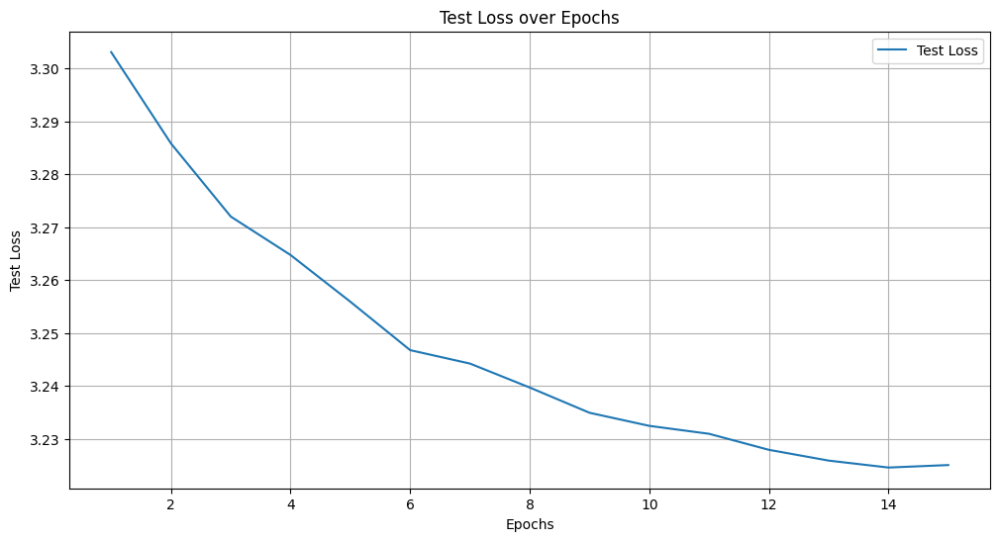

Test loss: 3.2250
Accuracy: 0.0784
Precision: 0.0317
Recall: 0.0278


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


tensor([86, 83, 83,  ..., 83, 83, 86])

In [ ]:
set_random_seed(42)
train_classification(model_class, optimizer_class, criterion_class, train_loader_class, test_loader_class, 15)
test_classification(model_class, criterion_class, test_loader_class)

Да уж модель, мягко говоря, оставляет желать лучшего, я меняла все, что могла (длину шага, оптимизатор, усложняла архитертуру).. я предполагаю, что это связано с тем, что модель очень многоклассовая (89 классов, если вывести num_classes). Проблема в том, что мы не можем ручаться, что классы сбаласированы, и у нас хвататет информации по каждому. В нашем же случае наибольшее количество объектов приходится на 2000-е, а потому их проще всего предсказывать. В остальном модель, конечно, легко может недообучаться..

По результатам теста предсказания такие: tensor([83, 83, 83,  ..., 83, 82, 84]), можно попробовать перевести обратно

In [ ]:
y_torch_train_class

tensor([78, 78, 78,  ..., 84, 83, 84])

In [ ]:
inverse = encoder1.inverse_transform(y_torch_train_class)
inverse

array([2001, 2001, 2001, ..., 2007, 2006, 2007])

In [ ]:
y_df = pd.Series(inverse)
y_df.value_counts()[:20]

,count
2007,35375
2006,33824
2005,31454
2008,31244
2009,27907
2004,26680
2003,24574
2002,21291
2001,19415
2000,17354


In [ ]:
y_df.value_counts()[:20].sum() / y_df.count()

0.8259555977270522

20 самых популярных классов (на них приходится 82% песен / объектов) относятся почти полностью к 2000м/началу 2010х/концу 1990х. На оставшие 69 классов приходится меньше 20%, а это ничтожно мало. Модель сложно обучить просто потому, что классы распределены совершенно неравномерно.

In [ ]:
# тут я постаралась хоть как-то улучшить модель, пользуясь советами из интернета
from torch.utils.data.sampler import WeightedRandomSampler

set_random_seed(42)
model_class_2 = ModelClassification(len(encoder1.classes_)).to(device) # так мы посмотрим, сколько у нас уникальных классов
optimizer_class_2 = torch.optim.Adam(model_class_2.parameters(), lr=0.001)

class_sample_count = np.array(
    [len(np.where( y_torch_train_class == t)[0]) for t in np.unique(y_torch_train_class)])
weight = 1. / class_sample_count
samples_weight = np.array([weight[t] for t in y_torch_train_class])

samples_weight = torch.from_numpy(samples_weight)
samples_weigth = samples_weight.double()
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))

train_dataset_class_2 = torch.utils.data.TensorDataset(X_torch_train_norm, y_torch_train_class)

train_loader_class_2 = DataLoader(
    train_dataset_class_2, batch_size=64, num_workers=1, sampler=sampler)

test_loader_class_2 = DataLoader(
    test_set_class, batch_size=64)

# https://discuss.pytorch.org/t/how-to-handle-imbalanced-classes/11264

criterion_class_2 = nn.CrossEntropyLoss()

In [ ]:
# код функции чуть-чуть подредактировала6 потому что у меня беда с некоторыми строчками (пометила ниже)
from sklearn.metrics import accuracy_score, precision_score, recall_score
def train_classification_2 (model, optimizer, criterion, train_loader, test_loader, n_epochs):

    loss_list = []
    for epoch in range(n_epochs):
      model.train()
      for batch in tqdm(train_loader):

        x_train, y_train = batch  # С ЭТИМИ ТРЕМЯ.
        x_train = x_train.to(device)
        y_train = y_train.to(device).long()

        y_train_pred = model(x_train).to(device)

        train_loss = criterion(y_train_pred, y_train.to(device))
        model.zero_grad()
        train_loss.backward()
        optimizer.step()

      model.eval()
      all_losses_test = 0
      with torch.no_grad():
        for batch in tqdm(test_loader):

          x_test = batch["sample"].to(device)
          y_test = batch["target"].to(device).long()

          y_test_pred = model(x_test).to(device)
          test_loss = criterion(y_test_pred, y_test)
          all_losses_test += test_loss.cpu().detach().numpy()
      avg_test_loss = all_losses_test / len(test_loader)
      loss_list.append(avg_test_loss)
      print(f'Epoch: {epoch + 1};  test_loss: {avg_test_loss:.4f}')
      # https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html - на этом базировалась при измнение функции трейна

    plt.figure(figsize=(12, 6))
    plt.plot(range(1, n_epochs + 1), loss_list, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Test Loss')
    plt.title('Test Loss over Epochs')
    plt.legend()
    plt.grid()
    plt.show()


def test_classification_2 (model, criterion, test_loader):
    """
    params:
        model - torch.nn.Module to be evaluated on test set
        criterion - loss function from torch.nn
        test_loader - torch.utils.data.Dataloader with test set
    ----------
    returns:
        predicts - torch.tensor with shape (len(test_loader.dataset), ),
                   which contains predictions for test objects
    """
    model.eval()
    preds = []
    classes = []
    total_loss = 0

    with torch.no_grad():
        for batch in test_loader:
            x_test = batch["sample"].to(device)
            y_test = batch["target"].to(device).long()
            y_pred = model(x_test)
            loss = criterion(y_pred, y_test.long()) #https://discuss.pytorch.org/t/multi-class-classification-variable-set-up-torch/66637
            total_loss += loss.item()

            predicted_classes = torch.argmax(y_pred, dim=1) # the class with the highest energy is what we choose as prediction -> https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
            preds.extend(predicted_classes.cpu().numpy())
            classes.extend(y_test.cpu().numpy())

    accuracy = accuracy_score(classes, preds)
    precision = precision_score(classes, preds, average='macro')
    recall = recall_score(classes, preds, average='macro')

    print(f'Test loss: {total_loss / len(test_loader):.4f}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')

    predicts = torch.tensor(preds)
    return predicts

  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 1;  test_loss: 3.9094


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 2;  test_loss: 3.7668


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 3;  test_loss: 3.8071


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 4;  test_loss: 3.8059


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 5;  test_loss: 3.7202


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 6;  test_loss: 3.7822


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 7;  test_loss: 3.6834


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 8;  test_loss: 3.8053


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 9;  test_loss: 3.6830


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 10;  test_loss: 3.6783


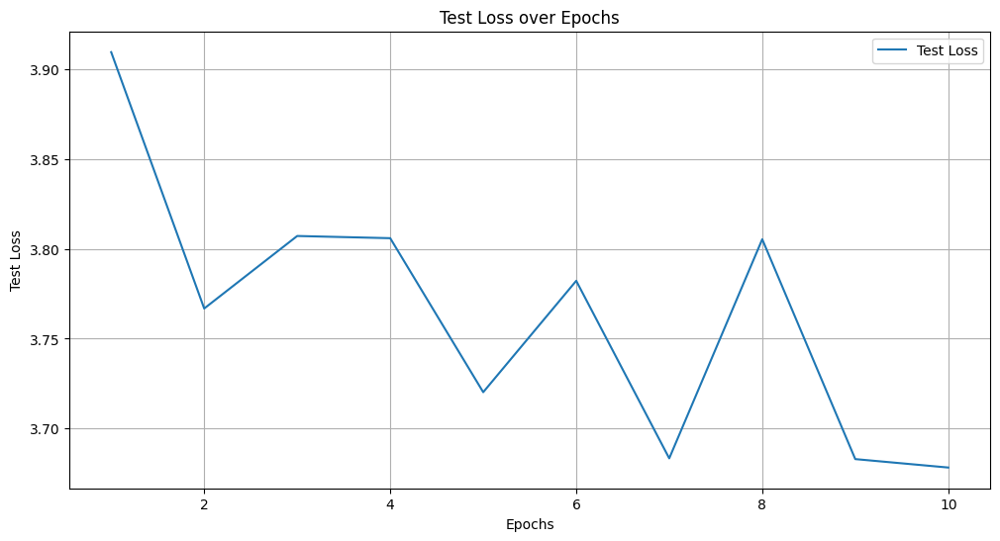

Test loss: 3.6783
Accuracy: 0.0495
Precision: 0.0249
Recall: 0.0491


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


tensor([87, 69, 50,  ..., 61, 50, 84])

In [ ]:
set_random_seed(42)
train_classification_2(model_class_2, optimizer_class_2, criterion_class_2, train_loader_class_2, test_loader_class_2, 10)
test_classification_2(model_class_2, criterion_class_2, test_loader_class_2)

Я так старалась, а получился босс недообучения и плохого качества.. Пожалуйста, не ставьте ноль, видит Бог, я правда старалась, как могла.. просто  баланс классов ВСЕЕЕ руинит:(((((
  Я уже и focal loss пыталась программить, но у меня сплошные ошибки в коде с ним, поэтому не стала оставлять...  скину только референсы, на которые ориентировалась:

  https://github.com/mathiaszinnen/focal_loss_torch

  https://pytorch.org/vision/main/_modules/torchvision/ops/focal_loss.html


Понимаете, просто классов очень много, вручную вводить веса классов не выйдет, надеюсь, нам кто-то объяснит, что делать, потому что даже ансамблирование запрещено

In [ ]:
# 2 вариант! я надеюсь, мне повезет больше

class ModelClassification_2(nn.Module):
    def __init__(self, num_classes):
      super(ModelClassification_2, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.1)
      self.linear2 = nn.Linear(90, 90)
      self.relu2 = nn.ReLU()
      self.dropout2 = nn.Dropout(0.1)
      self.linear3 = nn.Linear(90, num_classes)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      pred2 = self.dropout(pred)
      pred2 = self.linear2(pred2)
      pred2 = self.relu2(pred2)
      pred2 = self.dropout2(pred2)
      return self.linear3(pred2)

from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import train_test_split

X_norm_combined = pd.concat([pd.DataFrame(X_norm_train), pd.DataFrame(X_norm_test)], ignore_index=True)

discretizer = KBinsDiscretizer(n_bins=10,  encode='ordinal', strategy='uniform')
y_discretized = discretizer.fit_transform(pd.DataFrame(y).values.reshape(-1, 1)).flatten()

# https://stackoverflow.com/questions/70821138/discretize-continuous-target-variable-using-sklearn

X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_norm_combined, y_discretized, test_size=(len(y_test) / (len(y_train) + len(y_test))), shuffle=True, stratify=y_discretized)

X_torch_train_2 = torch.from_numpy(X_train_class.to_numpy()).float()
y_torch_train_2 = torch.from_numpy(y_train_class.flatten()).long()

X_torch_test_2 = torch.from_numpy(X_test_class.to_numpy()).float()
y_torch_test_2 = torch.from_numpy(y_test_class.flatten()).long()

In [ ]:
train_set_class_10 = MyDataset(X_torch_train_2, y_torch_train_2)
train_loader_class_10 = DataLoader(train_set_class_10, batch_size = 64, num_workers=0, worker_init_fn=_init_fn)

test_set_class_10 = MyDataset(X_torch_test_2, y_torch_test_2)
test_loader_class_10 = DataLoader(test_set_class_10, batch_size = 64, num_workers=0)

In [ ]:
set_random_seed(42)
model_class_10 = ModelClassification_2(10).to(device)
optimizer_class_10 = torch.optim.Adam(model_class_10.parameters(), lr=0.001)
criterion_class_10 = nn.CrossEntropyLoss()

In [ ]:
def test_classification_10(model, criterion, test_loader):

    model.eval()
    preds = []
    classes = []
    total_loss = 0

    with torch.no_grad():
        for batch in test_loader:
            x_test = batch["sample"].to(device)
            y_test = batch["target"].to(device).long()
            y_pred = model(x_test)
            loss = criterion(y_pred, y_test.long())
            total_loss += loss.item()

            predicted_classes = torch.argmax(y_pred, dim=1)
            preds.extend(predicted_classes.cpu().numpy())
            classes.extend(y_test.cpu().numpy())

    accuracy = accuracy_score(classes, preds)
    precision = precision_score(classes, preds, average='macro')
    recall = recall_score(classes, preds, average='macro')

    print(f'Test loss: {total_loss / len(test_loader):.4f}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')

    predicts = torch.tensor(preds)
    return predicts

In [ ]:
assert test_classification_10(model_class_10, criterion_class_10, test_loader_class_10).shape[0] == y_test.shape[0]

Test loss: 2.3531
Accuracy: 0.0652
Precision: 0.1117
Recall: 0.0894


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 1;  test_loss: 1.0157


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 2;  test_loss: 1.0070


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 3;  test_loss: 1.0030


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 4;  test_loss: 0.9999


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 5;  test_loss: 0.9970


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 6;  test_loss: 0.9970


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 7;  test_loss: 0.9944


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 8;  test_loss: 0.9940


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 9;  test_loss: 0.9939


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 10;  test_loss: 0.9949


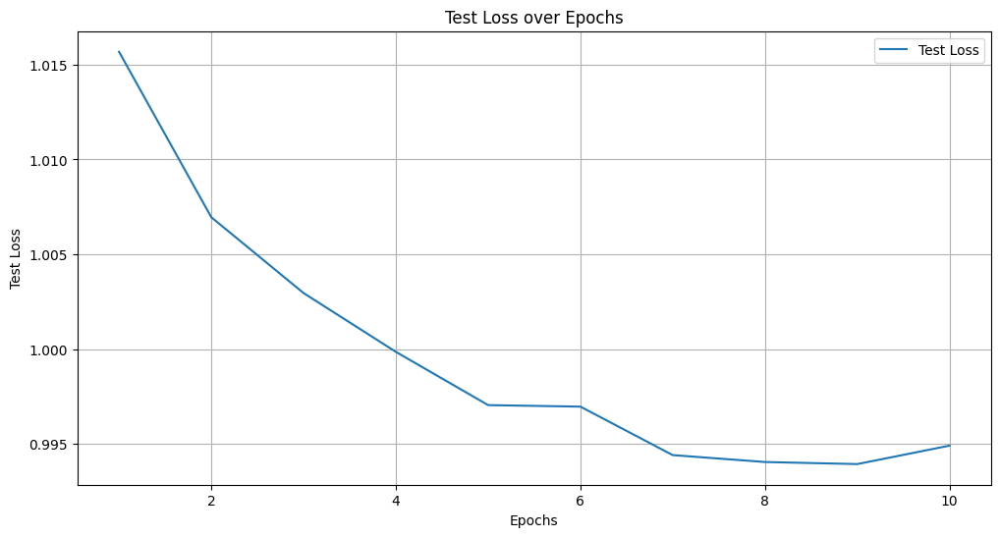

Test loss: 0.9949
Accuracy: 0.6019
Precision: 0.2754
Recall: 0.2028


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


tensor([9, 9, 9,  ..., 9, 9, 9])

In [ ]:
set_random_seed(42)
train_classification(model_class_10, optimizer_class_10, criterion_class_10, train_loader_class_10, test_loader_class_10, 10)
test_classification_10(model_class_10, criterion_class_10, test_loader_class_10)

Да уж, accuracy, конечно, кажется довольно высокой, но это необъективно, потому что у нас жесткий дисбаланс (ниже код), а accuracy это просто доля верных ответов. 9 класс (судя по маленькой части вывода) самый частый, более того, это даже может быть единственный ответ, если модель сильно переобучилась (она просто считает, что если выдавать самый репрезентативный класс, то шанс ошибиться меньше :( и увы, она права). Раньше такой проблемы не было просто потому, что классов (в том число сильно представленных) было очень много, и модели было сложнее найти оптимальный. Сейчас же самые часто встречающиеся попали в одну категорию, и модели это очень упростило жизнь.

Конечно, нужно бить ее по рукам за неверные ответы, и увеличить p у дропаута.

  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 1;  test_loss: 1.0819


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 2;  test_loss: 1.0593


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 3;  test_loss: 1.0503


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 4;  test_loss: 1.0448


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 5;  test_loss: 1.0406


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 6;  test_loss: 1.0389


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 7;  test_loss: 1.0369


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 8;  test_loss: 1.0347


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 9;  test_loss: 1.0338


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 10;  test_loss: 1.0317


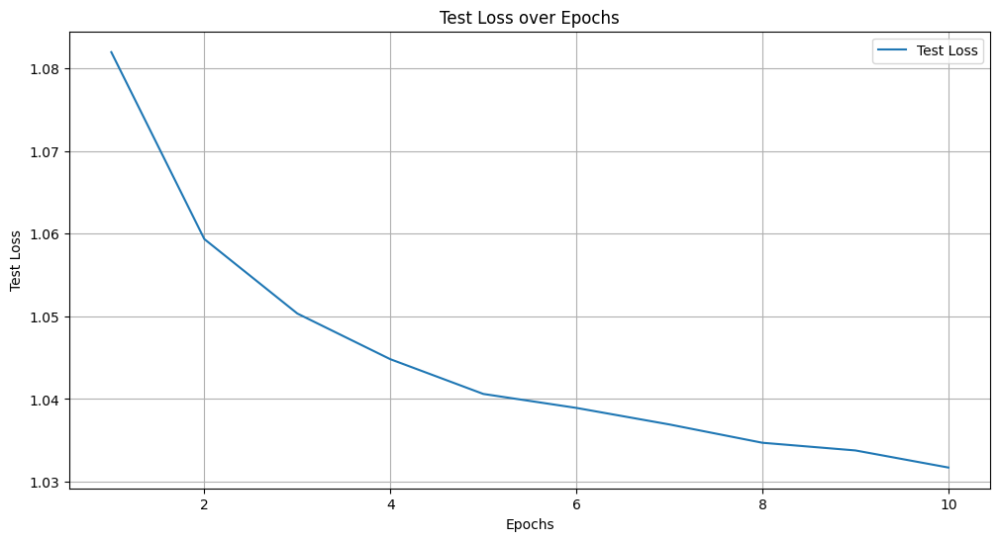

Test loss: 1.0317
Accuracy: 0.5863
Precision: 0.2326
Recall: 0.1714


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


tensor([9, 9, 9,  ..., 9, 9, 9])

In [ ]:
class SecondModelClassification_10(nn.Module):
    def __init__(self, num_classes):
      super(SecondModelClassification_10, self).__init__()
      self.linear1 = nn.Linear(90, 90)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.5)
      self.linear2 = nn.Linear(90, 90)
      self.relu2 = nn.ReLU()
      self.dropout2 = nn.Dropout(0.5)
      self.linear3 = nn.Linear(90, num_classes)

    def forward(self, x):
      pred = self.linear1(x)
      pred2 = self.relu(pred)
      pred2 = self.dropout(pred)
      pred2 = self.linear2(pred2)
      pred2 = self.relu2(pred2)
      pred2 = self.dropout2(pred2)
      return self.linear3(pred2)

set_random_seed(42)
second_model_class_10 = SecondModelClassification_10(10).to(device)
second_optimizer_class_10 = torch.optim.SGD(second_model_class_10.parameters(), lr=0.001,  momentum=0.9) # поменяла еще оптимизатор, чтобы добавить моментум
second_criterion_class_10 = nn.CrossEntropyLoss()

train_classification(second_model_class_10, second_optimizer_class_10, second_criterion_class_10, train_loader_class_10, test_loader_class_10, 10)
test_classification_10(second_model_class_10, second_criterion_class_10, test_loader_class_10)

Ладно, видимо теперь модель даже хуже угадывает самый частый класс.. могу попроовать добавить WeightedRandomSampler, как и в прошлый раз. Может, сейчас это выручит

In [ ]:
set_random_seed(42)
third_model_class_10 = ModelClassification_2(10).to(device)
third_optimizer_class_10 = torch.optim.Adam(third_model_class_10.parameters(), lr=0.0001)

class_sample_count_2 = np.array(
    [len(np.where(y_torch_train_2 == t)[0]) for t in np.unique(y_torch_train_2)])
weight_2 = 1. / class_sample_count_2
samples_weight_2 = np.array([weight_2[t] for t in y_torch_train_2])

samples_weight_2 = torch.from_numpy(samples_weight_2)
samples_weigth_2 = samples_weight_2.double()
sampler_2 = WeightedRandomSampler(samples_weight_2, len(samples_weight_2))

second_train_loader_class_10 = DataLoader(
    train_set_class_10, batch_size=64, num_workers=1, sampler=sampler_2)

second_test_loader_class_10 = DataLoader(
    test_set_class_10, batch_size=64)

third_criterion_class_10 = nn.CrossEntropyLoss()

  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 1;  test_loss: 1.4785


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 2;  test_loss: 1.4417


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 3;  test_loss: 1.4354


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 4;  test_loss: 1.4109


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 5;  test_loss: 1.4247


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 6;  test_loss: 1.4045


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 7;  test_loss: 1.4064


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 8;  test_loss: 1.3907


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 9;  test_loss: 1.3888


  0%|          | 0/7246 [00:00<?, ?it/s]

  0%|          | 0/807 [00:00<?, ?it/s]

Epoch: 10;  test_loss: 1.3745


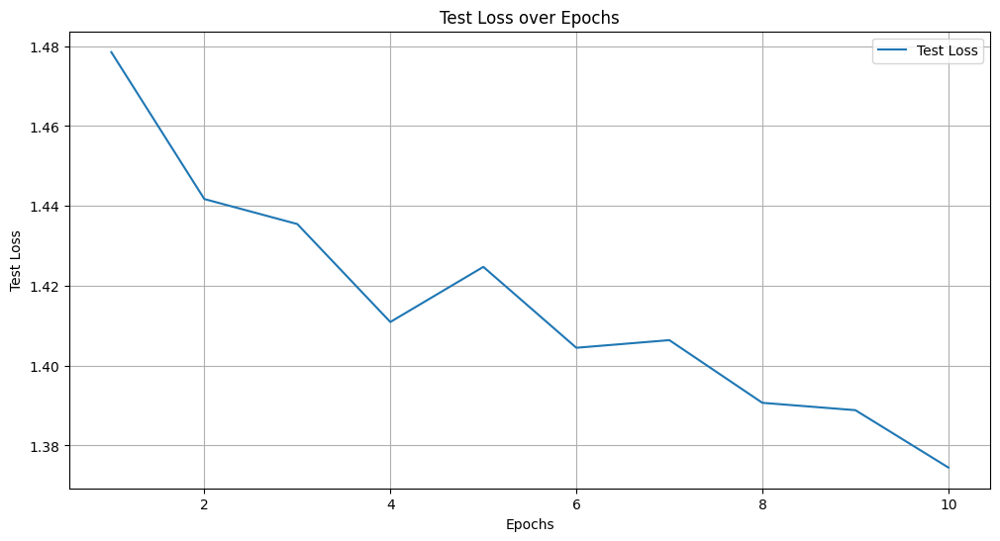

Test loss: 1.3745
Accuracy: 0.4835
Precision: 0.2309
Recall: 0.4944


tensor([8, 9, 5,  ..., 9, 9, 4])

In [ ]:
train_classification(third_model_class_10, third_optimizer_class_10, third_criterion_class_10, second_train_loader_class_10, second_test_loader_class_10, 10)
test_classification_10(third_model_class_10, third_criterion_class_10, second_test_loader_class_10)

Ладно, видимо, эта модель действительно очень тяжело обучаемая из-за дисбаланса.

Выше я уже объяснила, чем обе модели классификации отличаются друг от друга, ну а классификация и регрессия уж совсем различны в силу не похожих подходов к обучению. В задачи классификации, пытаясь минимизировать ошибку, мы используем CrossEntropyLoss, то есть считаем ошибку для каждого класса и суммируем. Исходя из этой простой логики, если какой-то класс преобладает, то его вклад становится решающим просто потому, что модели выгоднее предсказывать его. Сейчас наша модель совершенно не чувствительна к ошибкам других классов кроме песен 90 - 00ых, поэтому и качество такое плохое.

Напротив, модель регресиии не зависит от конкретных классов, она учится находить обущую тенденцию. В задаче мы минимизируем МСЕ для всех наблюдений, а не для отдельных классов, здесь вклад каждой ошибки пропорционален ее величине, поэтому модель не может подстроиться под самую популярную категорию. Именно поэтому модель регрессии качеством вышла гораздо лучше

**Все-все референсы**:

https://github.com/pytorch/pytorch/issues/7068

https://sky.pro/wiki/python/initsializatsiya-massiva-num-py-odinakovymi-znacheniyami/

https://stackoverflow.com/questions/67620076/create-dataset-out-of-x-train-and-y-train

https://pytorch.org/docs/stable/generated/torch.Tensor.item.html

https://habr.com/ru/articles/553716/

https://habr.com/ru/articles/553716/

https://www.geeksforgeeks.org/how-to-normalize-a-tensor-to-0-mean-and-1-variance-in-pytorch/

https://discuss.pytorch.org/t/random-seed-initialization/7854/15

https://stackoverflow.com/questions/42966393/is-it-good-learning-rate-for-adam-method

https://discuss.pytorch.org/t/rmse-loss-function/16540/3

https://discuss.pytorch.org/t/model-zero-grad-or-optimizer-zero-grad/28426/4

https://pytorch.org/tutorials/beginner/basics/optimization_tutorial.html

https://pytorch.org/tutorials/beginner/basics/saveloadrun_tutorial.html

https://www.projectpro.io/recipes/optimize-function-adam-pytorch

https://medium.com/analytics-vidhya/deep-learning-basics-weight-decay-3c68eb4344e9

https://machinelearningmastery.com/using-dropout-regularization-in-pytorch-models/

https://www.kaggle.com/code/aleksandrmogilevskiy/pytorch-labelencoding-vs-onehotencoding

https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html

https://discuss.pytorch.org/t/multi-class-classification-variable-set-up-torch/66637

https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html

https://discuss.pytorch.org/t/how-to-handle-imbalanced-classes/11264

https://github.com/mathiaszinnen/focal_loss_torch

https://pytorch.org/vision/main/_modules/torchvision/ops/focal_loss.html

https://stackoverflow.com/questions/70821138/discretize-continuous-target-variable-using-sklearn

https://neerc.ifmo.ru/wiki/index.php?title=Batch-normalization

https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html